# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Spain Real Estate Model Comparison + Feature Importance 📊**</div>
- Preprocessing
    - Detect continuous and categorical variables.
    - Normalize and impute data.
    

- For every target variable in the dataset:
    - Compare performance on 27 models + a TabNet model.
    - Output model performance and processed data in CSV format for every dataset.
    - Save plots + CSVs of XGBoost Feature Importances.
    - Save best performing FastAI model.

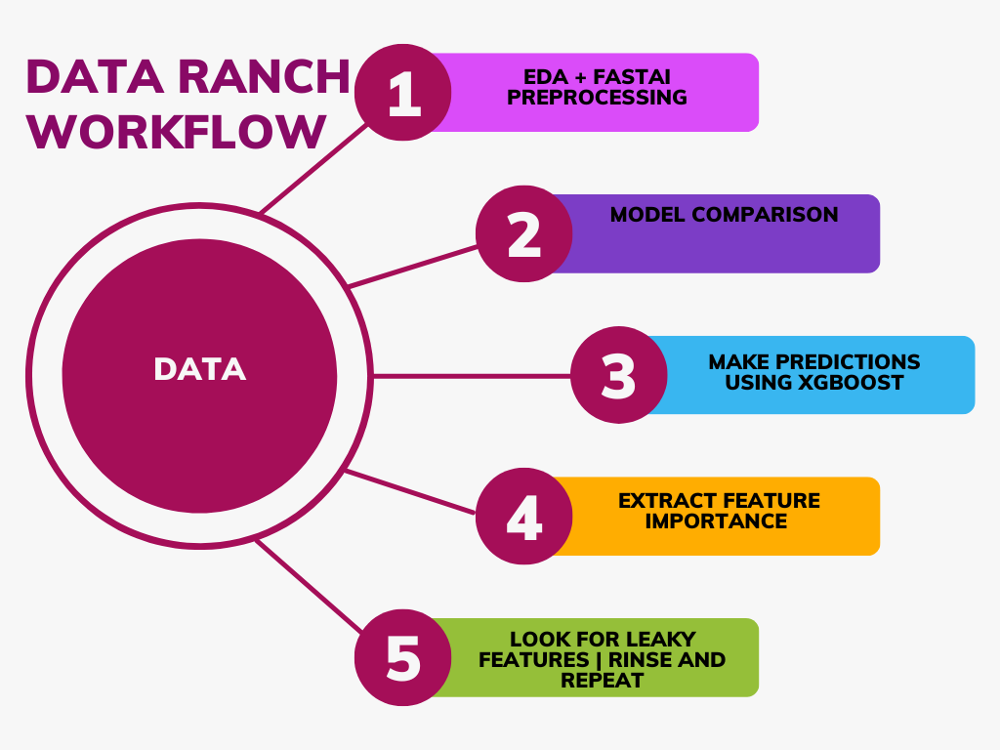

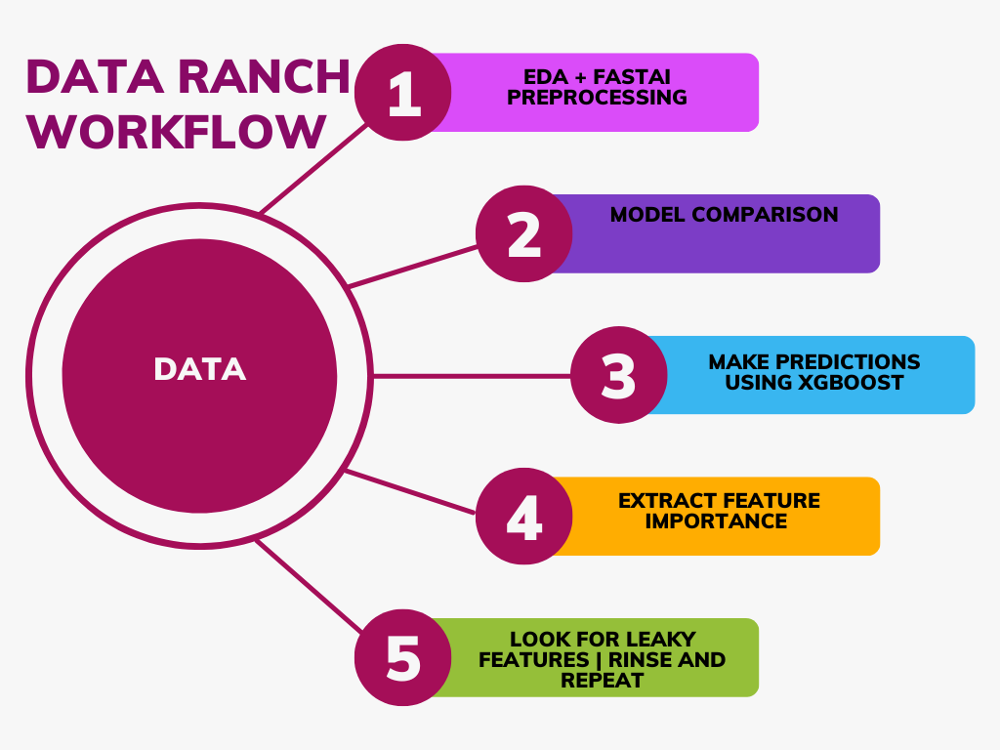

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install lazypredict

In [3]:
!pip install --upgrade pandas

In [4]:
!pip install fast-tabnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 967.1 kB/s eta 0:00:00


In [5]:
!pip install fastai

  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.3.0
    Uninstalling typing_extensions-4.3.0:
      Successfully uninstalled typing_extensions-4.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-io 0.21.0 requires tensorflow-io-gcs-filesystem==0.21.0, which is not installed.
tensorflow 2.6.4 requires h5py~=3.1.0, but you have h5py 3.7.0 which is incompatible.
tensorflow 2.6.4 requires numpy~=1.19.2, but you have numpy 1.21.6 which is incompatible.
tensorflow 2.6.4 requires tensorboard<2.7,>=2.6.0, but you have tensorboard 2.10.0 which is incompatible.
tensorflow 2.6.4 requires typing-extensions<3.11,>=3.7, but you have typing-extensions 4.1.1 which is incompatible.
tensorflow-transform 1.9.0 requires pyarrow<6,>=1, but you have pyarrow 8.0.0 which is incompatible.
tensorflow-transform 1.9.0 requires te

In [6]:
!pip install pandas-profiling

  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
beatrix-jupyterlab 3.1.7 requires google-cloud-bigquery-storage, which is not installed.
werkzeug 2.2.2 requires MarkupSafe>=2.1.1, but you have markupsafe 2.0.1 which is incompatible.


In [7]:
#A program that takes a csv and trains models on it. Streamlined model selection.
#==============================================================================

#LazyPredict
import lazypredict
from lazypredict.Supervised import LazyRegressor
from lazypredict.Supervised import LazyClassifier
#Baysian Optimization
from bayes_opt import BayesianOptimization
#Pandas stack
import pandas as pd
import pandas_profiling
import numpy as np
#FastAI
from fastai.tabular.all import *
from fastai.tabular.core import *
#Plots
import matplotlib.pyplot as plt
import seaborn as sns
#System
import os
import sys
import traceback
#Fit an xgboost model
from xgboost import XGBRegressor
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
#Random
import random

#TabNet
from fast_tabnet.core import *

import shutil

In [8]:
%matplotlib inline

In [9]:
#Project Variables
#===================================================================================================
PROJECT_NAME = 'idealista-madrid-rental-real-state'
VARIABLE_FILES = False
#Maximum amount of rows to take
SAMPLE_COUNT = 20000
FASTAI_LEARNING_RATE = 1e-1
AUTO_ADJUST_LEARNING_RATE = False
#Set to True automatically infer if variables are categorical or continuous
ENABLE_BREAKPOINT = True
#When trying to declare a column a continuous variable, if it fails, convert it to a categorical variable
CONVERT_TO_CAT = False
REGRESSOR = True
SEP_DOLLAR = True
SEP_PERCENT = True
SHUFFLE_DATA = True

In [10]:
input_dir = f'../input/{PROJECT_NAME}'
param_dir = f'/kaggle/working/{PROJECT_NAME}'
TARGET = ''
PARAM_DIR = param_dir
print(f'param_dir: {param_dir}')
if not os.path.exists(param_dir):
    os.makedirs(param_dir)
#rename any file in param_dir/file that ends with csv to data.csv
for file in os.listdir(input_dir):
    if file.endswith('.csv'):
        print('CSV!')
        if 'classification_results' not in file and 'regression_results' not in file:
            #os.rename(f'{input_dir}/{file}', f'{param_dir}/data.csv')
            shutil.copy(f'{input_dir}/{file}', f'{param_dir}/data.csv')
        #os.rename(f'{param_dir}/{file}', f'{param_dir}/data.csv')
try:
    df = pd.read_csv(f'{param_dir}/data.csv', nrows=SAMPLE_COUNT)
except:
    print(f'Please place a file named data.csv in {param_dir}')
    #sys.exit()

param_dir: /kaggle/working/idealista-madrid-rental-real-state
CSV!


In [11]:
df

,propertyCode,thumbnail,numPhotos,price,propertyType,operation,size,exterior,rooms,bathrooms,...,superTopHighlight,topNewDevelopment,externalReference,floor,district,neighborhood,hasLift,parkingSpace,labels,newDevelopmentFinished
0,98903350,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/7a/b5/61/1027174063.jpg,33,550.00,chalet,rent,371.00,False,6,3,...,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,91615378,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/59/73/3f/1024519300.jpg,12,750.00,flat,rent,60.00,True,1,1,...,False,False,AV23,3,Hortaleza,Canillas,True,NaN,NaN,NaN
2,88363329,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/0e/a1/25/1025350613.jpg,21,750.00,flat,rent,70.00,True,2,1,...,False,False,NaN,bj,Centro Urbano,NaN,False,NaN,NaN,NaN
3,98621753,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/96/1a/25/1018319776.jpg,28,400.00,penthouse,rent,67.00,True,2,2,...,False,False,90004,2,NaN,NaN,False,NaN,NaN,NaN
4,98222714,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/6c/2d/5b/1022163220.jpg,22,450.00,flat,rent,89.00,False,2,1,...,False,False,RP1882022101719,2,NaN,NaN,True,"{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': True}",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,98815692,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/9d/72/69/1024671265.jpg,16,640.00,flat,rent,69.00,True,2,1,...,False,False,2806/28060001/00000281,2,NaN,NaN,True,"{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': True}",NaN,NaN
446,97765107,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/03/f8/dc/989708380.jpg,19,700.00,flat,rent,54.00,True,1,1,...,False,False,CH-95178-0001,1,Getafe Centro,NaN,True,NaN,NaN,NaN
447,98620594,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/36/d5/1f/1018288747.jpg,16,700.00,flat,rent,59.00,True,1,1,...,False,False,NaN,6,Carabanchel,Pau de Carabanchel,True,"{'hasParkingSpace': True, 'isParkingSpaceIncludedInPrice': True}",NaN,NaN
448,98791417,https://img3.idealista.com/blur/WEB_LISTING/0/id.pro.es.image.master/7a/b7/a9/1023937294.jpg,11,700.00,flat,rent,75.00,True,2,1,...,False,False,NaN,1,Pryconsa - Poligono Europa,NaN,False,NaN,NaN,NaN


In [12]:
df.isna().sum()

propertyCode                0
thumbnail                   1
numPhotos                   0
price                       0
propertyType                0
operation                   0
size                        0
exterior                    0
rooms                       0
bathrooms                   0
address                     0
province                    0
municipality                0
country                     0
latitude                    0
longitude                   0
showAddress                 0
url                         0
distance                    0
description                 1
hasVideo                    0
status                      0
newDevelopment              0
priceByArea                 0
detailedType                0
suggestedTexts              0
hasPlan                     0
has3DTour                   0
has360                      0
hasStaging                  0
superTopHighlight           0
topNewDevelopment           0
externalReference          92
floor     

In [13]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#remove leaky features
del(df['propertyCode'])
del(df['address'])
del(df['latitude'])
del(df['longitude'])
del(df['description'])
del(df['url'])
del(df['suggestedTexts'])
del(df['externalReference'])

<AxesSubplot:>

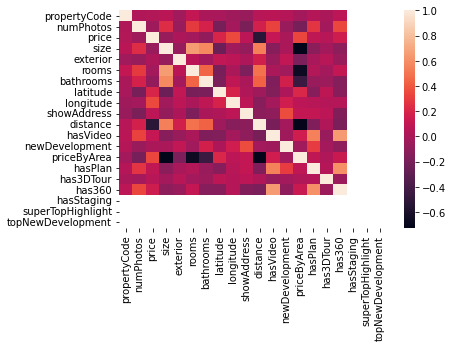

In [14]:
sns.heatmap(df.corr())

In [ ]:
df.head().style.background_gradient(cmap = "inferno")

In [16]:
df.describe().T.style.background_gradient(cmap = "viridis")

,count,mean,std,min,25%,50%,75%,max
propertyCode,450.00,94635146.39,13858169.73,666696.00,97564945.50,98660320.50,98894324.25,98939685.00
numPhotos,450.00,21.90,9.67,0.00,15.00,21.00,28.00,72.00
price,450.00,671.80,85.10,340.00,640.00,700.00,740.00,750.00
size,450.00,68.24,35.66,20.00,47.25,62.00,80.00,371.00
rooms,450.00,1.70,0.97,0.00,1.00,2.00,2.00,6.00
bathrooms,450.00,1.21,0.44,1.00,1.00,1.00,1.00,3.00
latitude,450.00,40.39,0.18,39.93,40.30,40.41,40.48,40.91
longitude,450.00,-3.70,0.23,-4.33,-3.78,-3.70,-3.60,-3.11
distance,450.00,22455.77,17001.69,183.00,7104.25,20294.00,34979.75,59919.00
priceByArea,450.00,11.88,5.40,1.00,8.00,11.00,15.00,33.00


In [17]:
df.columns

Index(['propertyCode', 'thumbnail', 'numPhotos', 'price', 'propertyType',
       'operation', 'size', 'exterior', 'rooms', 'bathrooms', 'address',
       'province', 'municipality', 'country', 'latitude', 'longitude',
       'showAddress', 'url', 'distance', 'description', 'hasVideo', 'status',
       'newDevelopment', 'priceByArea', 'detailedType', 'suggestedTexts',
       'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight',
       'topNewDevelopment', 'externalReference', 'floor', 'district',
       'neighborhood', 'hasLift', 'parkingSpace', 'labels',
       'newDevelopmentFinished'],
      dtype='object')

In [18]:
#remove leaky features
del(df['propertyCode'])
del(df['address'])
del(df['latitude'])
del(df['longitude'])
del(df['description'])
del(df['url'])
del(df['suggestedTexts'])
del(df['externalReference'])

Target Variable: newDevelopmentFinished
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'oper

 14%|█▍        | 6/42 [00:00<00:00, 57.31it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02026653289794922}
{'Model': 'BaggingRegressor', 'R-Squared': 0.83816091954023, 'Adjusted R-Squared': 0.7833846153846156, 'RMSE': 0.042640143271122075, 'Time taken': 0.02616143226623535}
{'Model': 'BayesianRidge', 'R-Squared': 0.4406275775713814, 'Adjusted R-Squared': 0.2513015269032336, 'RMSE': 0.0792733990139858, 'Time taken': 0.03237485885620117}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.008540153503417969}
{'Model': 'DummyRegressor', 'R-Squared': -0.006296175223059253, 'Adjusted R-Squared': -0.34688872683701777, 'RMSE': 0.10632609528611552, 'Time taken': 0.007564544677734375}
{'Model': 'ElasticNet', 'R-Squared': -0.006296175223059253, 'Adjusted R-Squared': -0.34688872683701777, 'RMSE': 0.10632609528611552, 'Time taken': 0.0094451904296875}
{'Model': 'ElasticNetCV', 'R-Squared': 0.4314683458123908, 'Adjusted R-Squ

 29%|██▊       | 12/42 [00:00<00:00, 30.25it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9464919540229885, 'Adjusted R-Squared': 0.9283815384615384, 'RMSE': 0.024518082380895197, 'Time taken': 0.09264683723449707}
{'Model': 'GammaRegressor', 'R-Squared': 0.47641006271573916, 'Adjusted R-Squared': 0.29919500701952784, 'RMSE': 0.07669597977739648, 'Time taken': 0.011322259902954102}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -23.517089053139077, 'Adjusted R-Squared': -31.815180732663073, 'RMSE': 0.524821244118201, 'Time taken': 0.04182720184326172}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9999999992900501, 'Adjusted R-Squared': 0.9999999990497594, 'RMSE': 2.824169829031471e-06, 'Time taken': 0.044405221939086914}


 45%|████▌     | 19/42 [00:00<00:01, 22.20it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.7944612368331648, 'Adjusted R-Squared': 0.724894270838236, 'RMSE': 0.04805336704260735, 'Time taken': 0.2140645980834961}
{'Model': 'HuberRegressor', 'R-Squared': -0.011494452634981611, 'Adjusted R-Squared': -0.35384642121912924, 'RMSE': 0.10660036870413181, 'Time taken': 0.04949069023132324}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.83816091954023, 'Adjusted R-Squared': 0.7833846153846156, 'RMSE': 0.042640143271122075, 'Time taken': 0.010972023010253906}
{'Model': 'KernelRidge', 'R-Squared': -90.76436222120665, 'Adjusted R-Squared': -121.82306943453813, 'RMSE': 1.0153458063958927, 'Time taken': 0.01741647720336914}
{'Model': 'Lars', 'R-Squared': 0.42711300648739126, 'Adjusted R-Squared': 0.2332127932985083, 'RMSE': 0.08022531580442066, 'Time taken': 0.016284942626953125}
{'Model': 'LarsCV', 'R-Squared': 0.43454817836353765, 'Adjusted R-Squared': 0.24316448488658127, 'RMSE': 0.07970301642191852, 'Time taken': 0.07360267639

 55%|█████▍    | 23/42 [00:00<00:00, 25.57it/s]

{'Model': 'LassoCV', 'R-Squared': 0.43166131336774904, 'Adjusted R-Squared': 0.23930052712298722, 'RMSE': 0.07990621580000515, 'Time taken': 0.05753970146179199}
{'Model': 'LassoLars', 'R-Squared': -0.006296175223059253, 'Adjusted R-Squared': -0.34688872683701777, 'RMSE': 0.10632609528611552, 'Time taken': 0.008681297302246094}
{'Model': 'LassoLarsCV', 'R-Squared': 0.43454817836353765, 'Adjusted R-Squared': 0.24316448488658127, 'RMSE': 0.07970301642191852, 'Time taken': 0.026958227157592773}
{'Model': 'LassoLarsIC', 'R-Squared': 0.4722509183016591, 'Adjusted R-Squared': 0.29362815218837457, 'RMSE': 0.07699999505922933, 'Time taken': 0.014562129974365234}
{'Model': 'LinearRegression', 'R-Squared': 0.4271130064873909, 'Adjusted R-Squared': 0.23321279329850786, 'RMSE': 0.08022531580442069, 'Time taken': 0.011315107345581055}
{'Model': 'LinearSVR', 'R-Squared': -0.01148989015622326, 'Adjusted R-Squared': -0.353840314516791, 'RMSE': 0.10660012828636925, 'Time taken': 0.012250423431396484}


 62%|██████▏   | 26/42 [00:01<00:00, 21.36it/s]

{'Model': 'MLPRegressor', 'R-Squared': -0.6197767970077761, 'Adjusted R-Squared': -1.1680089436873309, 'RMSE': 0.13489769871749632, 'Time taken': 0.17749285697937012}
{'Model': 'NuSVR', 'R-Squared': 0.9274390965248698, 'Adjusted R-Squared': 0.902880021502518, 'RMSE': 0.028551458280266444, 'Time taken': 0.030060291290283203}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.471458856392311, 'Adjusted R-Squared': 0.2925680077866317, 'RMSE': 0.07705775536514735, 'Time taken': 0.013441324234008789}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.4528440104717918, 'Adjusted R-Squared': 0.2676527524776291, 'RMSE': 0.07840297331944637, 'Time taken': 0.020772695541381836}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.10657005945907583, 'Adjusted R-Squared': -0.19582161272400622, 'RMSE': 0.10018603874226324, 'Time taken': 0.015499114990234375}
{'Model': 'PoissonRegressor', 'R-Squared': 0.4982169002368979, 'Adjusted R-Squared': 0.32838262031707877, 'RMSE': 0.0750818507215455

 76%|███████▌  | 32/42 [00:02<00:01,  9.29it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.011494252848227804, 'Adjusted R-Squared': -0.35384615381224327, 'RMSE': 0.10660035817647018, 'Time taken': 1.0183632373809814}
{'Model': 'RANSACRegressor', 'R-Squared': -0.011494252873563315, 'Adjusted R-Squared': -0.3538461538461539, 'RMSE': 0.10660035817780522, 'Time taken': 0.05815911293029785}


 81%|████████  | 34/42 [00:02<00:00,  9.22it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.8898482758620689, 'Adjusted R-Squared': 0.8525661538461538, 'RMSE': 0.03517811819867573, 'Time taken': 0.16283059120178223}
{'Model': 'Ridge', 'R-Squared': 0.42857558856483924, 'Adjusted R-Squared': 0.23517040315601567, 'RMSE': 0.08012284263258644, 'Time taken': 0.011512517929077148}
{'Model': 'RidgeCV', 'R-Squared': 0.4400925627162735, 'Adjusted R-Squared': 0.25058543009716616, 'RMSE': 0.07931130069435957, 'Time taken': 0.009435176849365234}
{'Model': 'SGDRegressor', 'R-Squared': 0.43106795274627185, 'Adjusted R-Squared': 0.23850633675270239, 'RMSE': 0.07994791701996296, 'Time taken': 0.009286642074584961}
{'Model': 'SVR', 'R-Squared': 0.15135234503593264, 'Adjusted R-Squared': -0.13588224587498243, 'RMSE': 0.09764289829015885, 'Time taken': 0.010145902633666992}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.4271130064873909, 'Adjusted R-Squared': 0.23321279329850786, 'RMSE': 0.08022531580442069, 'Time taken': 0.01102638244628

100%|██████████| 42/42 [00:03<00:00, 13.47it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999829736891531, 'Adjusted R-Squared': 0.9999772109377896, 'RMSE': 0.00043735816, 'Time taken': 0.4845609664916992}
{'Model': 'LGBMRegressor', 'R-Squared': 0.81931033104129, 'Adjusted R-Squared': 0.758153827701419, 'RMSE': 0.045055064449716985, 'Time taken': 0.12864136695861816}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: newDevelopmentFinished
newDevelopmentFinished
Target Standard Deviation: 0.13922284215086558
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
AdaBoostRegressor                            1.00       1.00  0.00        0.02
DecisionTreeRegressor                        1.00       1.00  0.00        0.01
GradientBoostingRegressor                    1.00       1.00  0.00        0.04
XGBRegressor                                 1.00       1.00  0.00        0.48
ExtraTreesRegressor     

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,6.125388,0.026740,0.163523,00:00
1,5.838546,0.054909,0.234326,00:00


Better model found at epoch 0 with _rmse value: 0.16352269053459167.
No improvement since epoch 0: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  0.00043735816


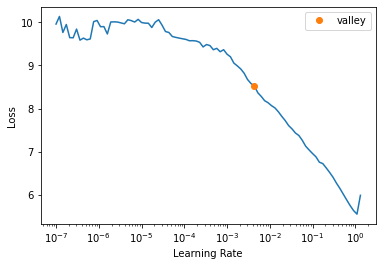

<Figure size 720x720 with 0 Axes>

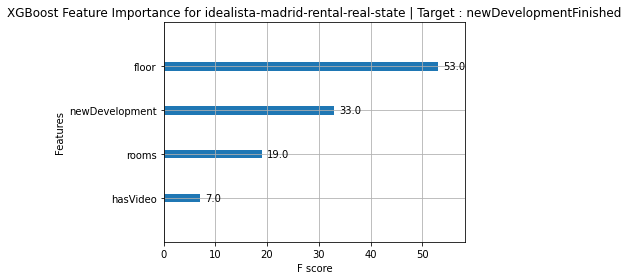

Target Variable: hasLift
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exteri

 17%|█▋        | 7/42 [00:00<00:00, 51.44it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.1696650214790687, 'Adjusted R-Squared': -0.11137143278955408, 'RMSE': 0.4551426727915905, 'Time taken': 0.02196478843688965}
{'Model': 'BaggingRegressor', 'R-Squared': 0.20837538638740538, 'Adjusted R-Squared': -0.059559098219934326, 'RMSE': 0.44440663405487674, 'Time taken': 0.025796175003051758}
{'Model': 'BayesianRidge', 'R-Squared': 0.22244325358779216, 'Adjusted R-Squared': -0.04072979904403207, 'RMSE': 0.44044018442033556, 'Time taken': 0.008987665176391602}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.108666896710375, 'Adjusted R-Squared': -0.4839080002123479, 'RMSE': 0.5259221098761353, 'Time taken': 0.010700225830078125}
{'Model': 'DummyRegressor', 'R-Squared': -0.021697793939653653, 'Adjusted R-Squared': -0.36750320111922874, 'RMSE': 0.5048729662213076, 'Time taken': 0.008387327194213867}
{'Model': 'ElasticNet', 'R-Squared': -0.021697793939653653, 'Adjusted R-Squared': -0.36750320111922874, 'RMSE': 0.5048729662213076, 'Time 

 43%|████▎     | 18/42 [00:00<00:01, 23.99it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.2725257612970089, 'Adjusted R-Squared': 0.026303711274458075, 'RMSE': 0.42601971572782216, 'Time taken': 0.20716047286987305}
{'Model': 'HuberRegressor', 'R-Squared': 0.1664271581773662, 'Adjusted R-Squared': -0.115705188285679, 'RMSE': 0.45602921613778863, 'Time taken': 0.014699220657348633}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.19834368530020696, 'Adjusted R-Squared': -0.07298614429049222, 'RMSE': 0.4472135954999579, 'Time taken': 0.008806943893432617}
{'Model': 'KernelRidge', 'R-Squared': -9.113120874481128, 'Adjusted R-Squared': -12.536023324305509, 'RMSE': 1.588413201645064, 'Time taken': 0.024749040603637695}
{'Model': 'Lars', 'R-Squared': 0.19935617070270628, 'Adjusted R-Squared': -0.07163097152099307, 'RMSE': 0.44693109270599235, 'Time taken': 0.026971817016601562}
{'Model': 'LarsCV', 'R-Squared': 0.20922038090856976, 'Adjusted R-Squared': -0.05842810555314504, 'RMSE': 0.44416938686249663, 'Time taken': 0.06483

 52%|█████▏    | 22/42 [00:00<00:00, 27.02it/s]

{'Model': 'LassoCV', 'R-Squared': 0.21068930591669055, 'Adjusted R-Squared': -0.05646200592689099, 'RMSE': 0.4437566582216342, 'Time taken': 0.055490970611572266}
{'Model': 'LassoLars', 'R-Squared': -0.021697793939653653, 'Adjusted R-Squared': -0.36750320111922874, 'RMSE': 0.5048729662213076, 'Time taken': 0.009341001510620117}
{'Model': 'LassoLarsCV', 'R-Squared': 0.20922038090856976, 'Adjusted R-Squared': -0.05842810555314504, 'RMSE': 0.44416938686249663, 'Time taken': 0.026981830596923828}
{'Model': 'LassoLarsIC', 'R-Squared': 0.20747580235020913, 'Adjusted R-Squared': -0.06076315685433542, 'RMSE': 0.4446590691081291, 'Time taken': 0.012582063674926758}
{'Model': 'LinearRegression', 'R-Squared': 0.19935617070270628, 'Adjusted R-Squared': -0.07163097152099307, 'RMSE': 0.44693109270599235, 'Time taken': 0.008423089981079102}
{'Model': 'LinearSVR', 'R-Squared': 0.03620343194691755, 'Adjusted R-Squared': -0.2900046372402796, 'RMSE': 0.49035835182798515, 'Time taken': 0.01935291290283203

 62%|██████▏   | 26/42 [00:01<00:00, 17.42it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.09327486938720286, 'Adjusted R-Squared': -0.2136167132817437, 'RMSE': 0.47561847408994884, 'Time taken': 0.3708677291870117}
{'Model': 'NuSVR', 'R-Squared': 0.17660340023993926, 'Adjusted R-Squared': -0.10208467967885038, 'RMSE': 0.4532370701729748, 'Time taken': 0.024541378021240234}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.12003895149116284, 'Adjusted R-Squared': -0.17779401877336665, 'RMSE': 0.4685464083655275, 'Time taken': 0.009832143783569336}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.17024140520895914, 'Adjusted R-Squared': -0.11059996533570082, 'RMSE': 0.45498467488726363, 'Time taken': 0.014420032501220703}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.5070737346277239, 'Adjusted R-Squared': -1.0171602294247997, 'RMSE': 0.6131802234905769, 'Time taken': 0.011828184127807617}
{'Model': 'PoissonRegressor', 'R-Squared': 0.21253478293997685, 'Adjusted R-Squared': -0.05399190591110781, 'RMSE': 0.443237583

 76%|███████▌  | 32/42 [00:02<00:01,  7.70it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -1.095238095258995, 'Adjusted R-Squared': -1.8043956044235778, 'RMSE': 0.7229988054848271, 'Time taken': 1.3586008548736572}
{'Model': 'RANSACRegressor', 'R-Squared': -0.41463376594088897, 'Adjusted R-Squared': -0.8934328867208821, 'RMSE': 0.5940772190767419, 'Time taken': 0.1287839412689209}


 81%|████████  | 34/42 [00:02<00:01,  7.60it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.14745729770814098, 'Adjusted R-Squared': -0.14109561691371897, 'RMSE': 0.461189020475233, 'Time taken': 0.14910316467285156}
{'Model': 'Ridge', 'R-Squared': 0.20023951736270162, 'Adjusted R-Squared': -0.07044864599146083, 'RMSE': 0.44668447615344187, 'Time taken': 0.010801315307617188}
{'Model': 'RidgeCV', 'R-Squared': 0.20699474653382854, 'Adjusted R-Squared': -0.061407031562414005, 'RMSE': 0.4447940008756403, 'Time taken': 0.01185750961303711}
{'Model': 'SGDRegressor', 'R-Squared': 0.2130913822658651, 'Adjusted R-Squared': -0.05324691912107271, 'RMSE': 0.4430809106367081, 'Time taken': 0.009533405303955078}
{'Model': 'SVR', 'R-Squared': 0.15277857355792213, 'Adjusted R-Squared': -0.13397329385324253, 'RMSE': 0.4597474765970524, 'Time taken': 0.016901254653930664}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.19935617070270628, 'Adjusted R-Squared': -0.07163097152099307, 'RMSE': 0.44693109270599235, 'Time taken': 0.01129436492

100%|██████████| 42/42 [00:03<00:00, 12.41it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.010542460806469589, 'Adjusted R-Squared': -0.3243508601513405, 'RMSE': 0.49684334, 'Time taken': 0.29611635208129883}
{'Model': 'LGBMRegressor', 'R-Squared': 0.29997681998222303, 'Adjusted R-Squared': 0.06304589751466783, 'RMSE': 0.41790454984764247, 'Time taken': 0.04275965690612793}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: hasLift
hasLift
Target Standard Deviation: 0.4974078166382776
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
LGBMRegressor                                0.06       0.30  0.42        0.04
GradientBoostingRegressor                    0.04       0.28  0.42        0.06
HistGradientBoostingRegressor                0.03       0.27  0.43        0.21
BayesianRidge                               -0.04       0.22  0.44        0.01
SGDRegressor                                -0.05 

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,8.345305,0.969687,0.984727,00:00
1,7.159572,0.330030,0.574482,00:00
2,5.696944,0.983591,0.991761,00:00


Better model found at epoch 0 with _rmse value: 0.9847269654273987.
Better model found at epoch 1 with _rmse value: 0.5744820237159729.
No improvement since epoch 1: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       2       2.01
1       2       1.72
2       1       1.78
3       2       1.93
4       2       1.64
XGBoost RMSE:  0.49684334


<Figure size 432x288 with 0 Axes>

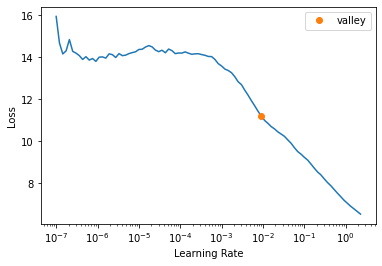

<Figure size 720x720 with 0 Axes>

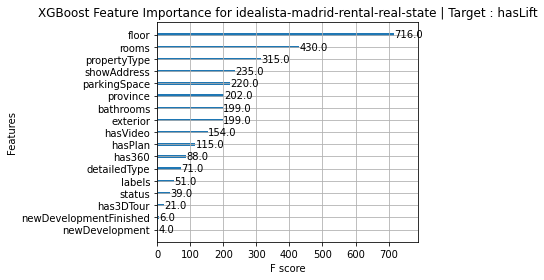

Target Variable: topNewDevelopment
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.013574600219726562}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02377486228942871}
{'Model': 'BayesianRidge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.009579658508300781}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.008622407913208008}
{'Model': 'DummyRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.008008718490600586}
{'Model': 'ElasticNet', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.010698318481445312}


 26%|██▌       | 11/42 [00:00<00:01, 29.33it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.15474867820739746}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01312565803527832}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.08198976516723633}
{'Model': 'GammaRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.009335756301879883}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.49702579001600583, 'Time taken': 0.03698229789733887}


 33%|███▎      | 14/42 [00:00<00:01, 25.00it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.06628727912902832}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.06686019897460938}
{'Model': 'HuberRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 5.368664738092922e-12, 'Time taken': 0.022006511688232422}
{'Model': 'KNeighborsRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.011899471282958984}
{'Model': 'KernelRidge', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 1.0000000000000266, 'Time taken': 0.02552485466003418}
{'Model': 'Lars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.019046545028686523}
LarsCV model failed to execute
x and y arrays must have at least 2 entries


 45%|████▌     | 19/42 [00:00<00:00, 29.51it/s]

{'Model': 'Lasso', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.039575815200805664}
{'Model': 'LassoCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.17192721366882324}
{'Model': 'LassoLars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.009320735931396484}
LassoLarsCV model failed to execute
x and y arrays must have at least 2 entries


 62%|██████▏   | 26/42 [00:01<00:00, 22.98it/s]

{'Model': 'LassoLarsIC', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.014154672622680664}
{'Model': 'LinearRegression', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.011003732681274414}
{'Model': 'LinearSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 5.063811755719186e-06, 'Time taken': 0.009575366973876953}
{'Model': 'MLPRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.1408531130623168, 'Time taken': 0.14084529876708984}
{'Model': 'NuSVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.013449907302856445}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.013448715209960938}
OrthogonalMatchingPursuitCV model failed to execute
attempt to get argmin of an empty sequence
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.0

 81%|████████  | 34/42 [00:01<00:00, 12.08it/s]

{'Model': 'QuantileRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 6.750155989720952e-14, 'Time taken': 0.7297582626342773}
{'Model': 'RANSACRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02199101448059082}
{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.15149903297424316}
{'Model': 'Ridge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01219320297241211}
{'Model': 'RidgeCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.013821601867675781}
{'Model': 'SGDRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.0035211710574518146, 'Time taken': 0.01010584831237793}
{'Model': 'SVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.008468389511108398}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'T

100%|██████████| 42/42 [00:02<00:00, 17.94it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 5.9604645e-08, 'Time taken': 0.2509191036224365}
{'Model': 'LGBMRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02294301986694336}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: topNewDevelopment
topNewDevelopment
Target Standard Deviation: 0.0
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
AdaBoostRegressor                            1.00       1.00  0.00        0.01
Lasso                                        1.00       1.00  0.00        0.04
TweedieRegressor                             1.00       1.00  0.00        0.01
TransformedTargetRegressor                   1.00       1.00  0.00        0.01
SVR                                          1.00       1.00  0.00        0.01
RidgeCV                     

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,8.946000,2.354142,1.534321,00:00
1,6.907289,0.702168,0.837955,00:00
2,6.037205,0.046465,0.215558,00:00
3,5.300776,0.025723,0.160383,00:00
4,4.573178,0.008757,0.093579,00:00
5,3.818042,0.013792,0.117438,00:00


Better model found at epoch 0 with _rmse value: 1.5343214273452759.
Better model found at epoch 1 with _rmse value: 0.8379549384117126.
Better model found at epoch 2 with _rmse value: 0.21555833518505096.
Better model found at epoch 3 with _rmse value: 0.1603827029466629.
Better model found at epoch 4 with _rmse value: 0.09357890486717224.
No improvement since epoch 4: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  5.9604645e-08
XGBoost failed
Target Variable: superTopHighlight
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail


Traceback (most recent call last):
  File "/tmp/ipykernel_19/1746676157.py", line 323, in <module>
    plot_importance(xgb)
  File "/opt/conda/lib/python3.7/site-packages/xgboost/plotting.py", line 75, in plot_importance
    'Booster.get_score() results in empty.  ' +
ValueError: Booster.get_score() results in empty.  This maybe caused by having all trees as decision dumps.


Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
Tabular Object size: 442


  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.015841245651245117}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.025617599487304688}
{'Model': 'BayesianRidge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.011584997177124023}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.008393049240112305}
{'Model': 'DummyRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.007248878479003906}
{'Model': 'ElasticNet', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.010382413864135742}


 17%|█▋        | 7/42 [00:00<00:01, 29.31it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.15926289558410645}


 24%|██▍       | 10/42 [00:00<00:01, 28.16it/s]

{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.013384580612182617}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.0870964527130127}
{'Model': 'GammaRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.011645793914794922}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.5852176870810869, 'Time taken': 0.038495540618896484}


 43%|████▎     | 18/42 [00:00<00:00, 29.61it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.0731973648071289}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.07327580451965332}
{'Model': 'HuberRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 5.197564514428559e-12, 'Time taken': 0.020238876342773438}
{'Model': 'KNeighborsRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.010050296783447266}
{'Model': 'KernelRidge', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.9999999999999539, 'Time taken': 0.0285036563873291}
{'Model': 'Lars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.017752408981323242}
LarsCV model failed to execute
x and y arrays must have at least 2 entries


 52%|█████▏    | 22/42 [00:00<00:00, 23.65it/s]

{'Model': 'Lasso', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03414654731750488}
{'Model': 'LassoCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.17976641654968262}
{'Model': 'LassoLars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.009449243545532227}
LassoLarsCV model failed to execute
x and y arrays must have at least 2 entries


 62%|██████▏   | 26/42 [00:01<00:00, 23.05it/s]

{'Model': 'LassoLarsIC', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.013667821884155273}
{'Model': 'LinearRegression', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.009273529052734375}
{'Model': 'LinearSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 8.268330663865434e-07, 'Time taken': 0.009159088134765625}
{'Model': 'MLPRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.11989992708961972, 'Time taken': 0.1492445468902588}
{'Model': 'NuSVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.014257431030273438}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.013196706771850586}
OrthogonalMatchingPursuitCV model failed to execute
attempt to get argmin of an empty sequence
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.0

 81%|████████  | 34/42 [00:01<00:00, 13.15it/s]

{'Model': 'QuantileRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 7.460698725481052e-14, 'Time taken': 0.6307218074798584}
{'Model': 'RANSACRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.015898942947387695}
{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.15653324127197266}
{'Model': 'Ridge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01021718978881836}
{'Model': 'RidgeCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.009026288986206055}
{'Model': 'SGDRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.0033692979344840846, 'Time taken': 0.010375738143920898}
{'Model': 'SVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.008713960647583008}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 

100%|██████████| 42/42 [00:02<00:00, 18.56it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 5.9604645e-08, 'Time taken': 0.25097060203552246}
{'Model': 'LGBMRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01855945587158203}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: superTopHighlight
superTopHighlight
Target Standard Deviation: 0.0
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
AdaBoostRegressor                            1.00       1.00  0.00        0.02
Lasso                                        1.00       1.00  0.00        0.03
TweedieRegressor                             1.00       1.00  0.00        0.01
TransformedTargetRegressor                   1.00       1.00  0.00        0.01
SVR                                          1.00       1.00  0.00        0.01
RidgeCV                    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,4.072885,2.040603,1.428497,00:00
1,4.412551,0.906565,0.952137,00:00
2,5.375550,0.111116,0.333340,00:00
3,4.558121,0.284826,0.533691,00:00


Better model found at epoch 0 with _rmse value: 1.4284965991973877.
Better model found at epoch 1 with _rmse value: 0.9521372318267822.
Better model found at epoch 2 with _rmse value: 0.33334022760391235.
No improvement since epoch 2: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  5.9604645e-08
XGBoost failed
Target Variable: hasStaging
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail


Traceback (most recent call last):
  File "/tmp/ipykernel_19/1746676157.py", line 323, in <module>
    plot_importance(xgb)
  File "/opt/conda/lib/python3.7/site-packages/xgboost/plotting.py", line 75, in plot_importance
    'Booster.get_score() results in empty.  ' +
ValueError: Booster.get_score() results in empty.  This maybe caused by having all trees as decision dumps.


Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
Tabular Object size: 442


  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.015216350555419922}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.024692535400390625}
{'Model': 'BayesianRidge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.009227991104125977}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.008393049240112305}
{'Model': 'DummyRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.00783538818359375}
{'Model': 'ElasticNet', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.011105537414550781}


 24%|██▍       | 10/42 [00:00<00:01, 29.22it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.15962862968444824}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.010994195938110352}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.08312368392944336}
{'Model': 'GammaRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.009208440780639648}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.5521743369042714, 'Time taken': 0.03361010551452637}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03577470779418945}


 45%|████▌     | 19/42 [00:00<00:00, 32.33it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.11102151870727539}
{'Model': 'HuberRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 5.0343130254776244e-12, 'Time taken': 0.020985126495361328}
{'Model': 'KNeighborsRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.010518074035644531}
{'Model': 'KernelRidge', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.999999999999972, 'Time taken': 0.029145002365112305}
{'Model': 'Lars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.017289400100708008}
LarsCV model failed to execute
x and y arrays must have at least 2 entries
{'Model': 'Lasso', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.017813444137573242}


 62%|██████▏   | 26/42 [00:01<00:00, 23.12it/s]

{'Model': 'LassoCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.18918132781982422}
{'Model': 'LassoLars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.0084075927734375}
LassoLarsCV model failed to execute
x and y arrays must have at least 2 entries
{'Model': 'LassoLarsIC', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.00879669189453125}
{'Model': 'LinearRegression', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.008463144302368164}
{'Model': 'LinearSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 1.5794056112159146e-06, 'Time taken': 0.008271217346191406}
{'Model': 'MLPRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.13410893880107047, 'Time taken': 0.15369296073913574}
{'Model': 'NuSVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.014348983764648438}
{'Model': 'OrthogonalMatchingPu

 81%|████████  | 34/42 [00:01<00:00, 13.06it/s]

{'Model': 'QuantileRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 7.815970093361102e-14, 'Time taken': 0.6227757930755615}
{'Model': 'RANSACRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.026702165603637695}
{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.15296578407287598}
{'Model': 'Ridge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.010746002197265625}
{'Model': 'RidgeCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.012637138366699219}
{'Model': 'SGDRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 0.0035249584340936242, 'Time taken': 0.00981760025024414}
{'Model': 'SVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.00833749771118164}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, '

100%|██████████| 42/42 [00:02<00:00, 18.81it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.33846153846153837, 'RMSE': 5.9604645e-08, 'Time taken': 0.258620023727417}
{'Model': 'LGBMRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.019084930419921875}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: hasStaging
hasStaging
Target Standard Deviation: 0.0
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
AdaBoostRegressor                            1.00       1.00  0.00        0.02
Lasso                                        1.00       1.00  0.00        0.02
TweedieRegressor                             1.00       1.00  0.00        0.01
TransformedTargetRegressor                   1.00       1.00  0.00        0.01
SVR                                          1.00       1.00  0.00        0.01
RidgeCV                                   

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,3.401695,0.310956,0.557634,00:00
1,3.260952,0.320262,0.565917,00:00


Better model found at epoch 0 with _rmse value: 0.5576344728469849.
No improvement since epoch 0: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  5.9604645e-08
XGBoost failed
Target Variable: has360
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail


Traceback (most recent call last):
  File "/tmp/ipykernel_19/1746676157.py", line 323, in <module>
    plot_importance(xgb)
  File "/opt/conda/lib/python3.7/site-packages/xgboost/plotting.py", line 75, in plot_importance
    'Booster.get_score() results in empty.  ' +
ValueError: Booster.get_score() results in empty.  This maybe caused by having all trees as decision dumps.


Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
Tabular Object size: 442


 17%|█▋        | 7/42 [00:00<00:00, 51.01it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.6384420705621601, 'Adjusted R-Squared': 0.5160686175216604, 'RMSE': 0.23738862678744976, 'Time taken': 0.0240018367767334}
{'Model': 'BaggingRegressor', 'R-Squared': 0.6902219182261428, 'Adjusted R-Squared': 0.5853739520872988, 'RMSE': 0.21973351649747425, 'Time taken': 0.02470231056213379}
{'Model': 'BayesianRidge', 'R-Squared': 0.5999548410033977, 'Adjusted R-Squared': 0.4645549410353169, 'RMSE': 0.24970398459193074, 'Time taken': 0.008996009826660156}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.4149280711003992, 'Adjusted R-Squared': 0.21690372593438056, 'RMSE': 0.301978201132845, 'Time taken': 0.008246183395385742}
{'Model': 'DummyRegressor', 'R-Squared': -0.0010897785939809612, 'Adjusted R-Squared': -0.33992016519502055, 'RMSE': 0.39500944170294205, 'Time taken': 0.007687568664550781}
{'Model': 'ElasticNet', 'R-Squared': -0.0010897785939809612, 'Adjusted R-Squared': -0.33992016519502055, 'RMSE': 0.39500944170294205, 'Time taken':

 40%|████      | 17/42 [00:00<00:01, 22.72it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.6868991841651276, 'Adjusted R-Squared': 0.5809266003440939, 'RMSE': 0.2209088233936988, 'Time taken': 0.17526459693908691}
{'Model': 'HuberRegressor', 'R-Squared': 0.5601134741726448, 'Adjusted R-Squared': 0.41122880389261696, 'RMSE': 0.2618431955858106, 'Time taken': 0.04059290885925293}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.7433637116818559, 'Adjusted R-Squared': 0.6565021987126379, 'RMSE': 0.19999999999999998, 'Time taken': 0.012810230255126953}
{'Model': 'KernelRidge', 'R-Squared': -9.009405528507541, 'Adjusted R-Squared': -12.39720432277163, 'RMSE': 1.2490364298996661, 'Time taken': 0.02890300750732422}
{'Model': 'Lars', 'R-Squared': 0.5960758714611926, 'Adjusted R-Squared': 0.4593630894942117, 'RMSE': 0.25091167013927257, 'Time taken': 0.030826807022094727}
{'Model': 'LarsCV', 'R-Squared': 0.6120353657073798, 'Adjusted R-Squared': 0.4807242587160315, 'RMSE': 0.24590481469752615, 'Time taken': 0.07705926895141602}

 50%|█████     | 21/42 [00:00<00:00, 23.43it/s]

{'Model': 'Lasso', 'R-Squared': -0.0010897785939809612, 'Adjusted R-Squared': -0.33992016519502055, 'RMSE': 0.39500944170294205, 'Time taken': 0.012975692749023438}
{'Model': 'LassoCV', 'R-Squared': 0.6114194053192532, 'Adjusted R-Squared': 0.4798998194273082, 'RMSE': 0.24609994530891577, 'Time taken': 0.05414104461669922}
{'Model': 'LassoLars', 'R-Squared': -0.0010897785939809612, 'Adjusted R-Squared': -0.33992016519502055, 'RMSE': 0.39500944170294205, 'Time taken': 0.008609771728515625}
{'Model': 'LassoLarsCV', 'R-Squared': 0.6120353657073798, 'Adjusted R-Squared': 0.4807242587160315, 'RMSE': 0.24590481469752615, 'Time taken': 0.027286291122436523}
{'Model': 'LassoLarsIC', 'R-Squared': 0.6088564669405386, 'Adjusted R-Squared': 0.4764694249819518, 'RMSE': 0.24691020499134922, 'Time taken': 0.012331724166870117}
{'Model': 'LinearRegression', 'R-Squared': 0.5960758714611927, 'Adjusted R-Squared': 0.4593630894942118, 'RMSE': 0.2509116701392725, 'Time taken': 0.009052753448486328}
{'Model

 69%|██████▉   | 29/42 [00:01<00:00, 20.71it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.6837779828583996, 'Adjusted R-Squared': 0.5767489924412426, 'RMSE': 0.22200717739365194, 'Time taken': 0.28801727294921875}
{'Model': 'NuSVR', 'R-Squared': 0.7647549959247497, 'Adjusted R-Squared': 0.6851336099300496, 'RMSE': 0.19148341638337388, 'Time taken': 0.06545591354370117}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.553089156861454, 'Adjusted R-Squared': 0.4018270253376385, 'RMSE': 0.263925533924168, 'Time taken': 0.01269078254699707}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.6106703402277215, 'Adjusted R-Squared': 0.47889722461248885, 'RMSE': 0.24633703399258292, 'Time taken': 0.018294572830200195}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.48212196273193975, 'Adjusted R-Squared': 0.3068401655027502, 'RMSE': 0.28410881556806766, 'Time taken': 0.012289285659790039}
{'Model': 'PoissonRegressor', 'R-Squared': 0.5542977513469274, 'Adjusted R-Squared': 0.40344468257204136, 'RMSE': 0.2635684214284979, 'Time

 76%|███████▌  | 32/42 [00:02<00:01,  6.39it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.23943661969943708, 'Adjusted R-Squared': -0.6589382448284773, 'RMSE': 0.43952453649242, 'Time taken': 1.3827714920043945}
{'Model': 'RANSACRegressor', 'R-Squared': -0.23943661971830954, 'Adjusted R-Squared': -0.6589382448537373, 'RMSE': 0.4395245364957663, 'Time taken': 0.1253054141998291}


 81%|████████  | 34/42 [00:03<00:01,  6.60it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.658574502529818, 'Adjusted R-Squared': 0.5430151033860641, 'RMSE': 0.23068477815121513, 'Time taken': 0.13457584381103516}
{'Model': 'Ridge', 'R-Squared': 0.5964533715517426, 'Adjusted R-Squared': 0.4598683588461786, 'RMSE': 0.2507943940067597, 'Time taken': 0.009399175643920898}
{'Model': 'RidgeCV', 'R-Squared': 0.5989274603875616, 'Adjusted R-Squared': 0.46317983159565945, 'RMSE': 0.25002441908433126, 'Time taken': 0.009068012237548828}
{'Model': 'SGDRegressor', 'R-Squared': 0.6036844440362963, 'Adjusted R-Squared': 0.4695468712485812, 'RMSE': 0.24853726940457535, 'Time taken': 0.009277582168579102}
{'Model': 'SVR', 'R-Squared': 0.7132556539078183, 'Adjusted R-Squared': 0.6162037213843107, 'RMSE': 0.21140652843548252, 'Time taken': 0.01483154296875}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.5960758714611927, 'Adjusted R-Squared': 0.4593630894942118, 'RMSE': 0.2509116701392725, 'Time taken': 0.009275436401367188}
{'Model':

100%|██████████| 42/42 [00:03<00:00, 12.32it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.4641435138948533, 'Adjusted R-Squared': 0.28277670321311144, 'RMSE': 0.28899825, 'Time taken': 0.2874584197998047}
{'Model': 'LGBMRegressor', 'R-Squared': 0.684724048684444, 'Adjusted R-Squared': 0.5780152651622559, 'RMSE': 0.22167483062303336, 'Time taken': 0.04439806938171387}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: has360
has360
Target Standard Deviation: 0.4045864446526291
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
NuSVR                                        0.69       0.76  0.19        0.07
KNeighborsRegressor                          0.66       0.74  0.20        0.01
GradientBoostingRegressor                    0.65       0.74  0.20        0.12
SVR                                          0.62       0.71  0.21        0.01
BaggingRegressor                             0.59       0.

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,5.115689,0.605824,0.778347,00:00
1,4.600301,0.713183,0.844502,00:00


Better model found at epoch 0 with _rmse value: 0.7783471345901489.
No improvement since epoch 0: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.01
1       1       0.99
2       1       0.98
3       1       0.99
4       1       1.01
XGBoost RMSE:  0.2889949


<Figure size 432x288 with 0 Axes>

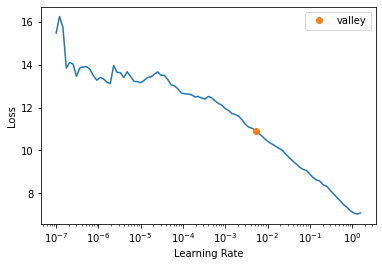

<Figure size 720x720 with 0 Axes>

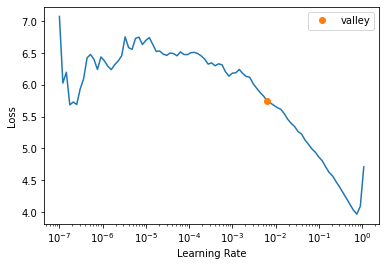

<Figure size 720x720 with 0 Axes>

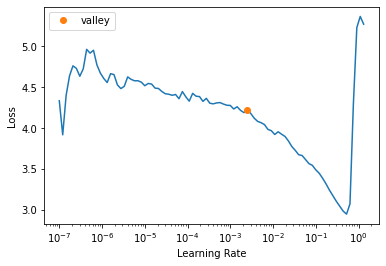

<Figure size 720x720 with 0 Axes>

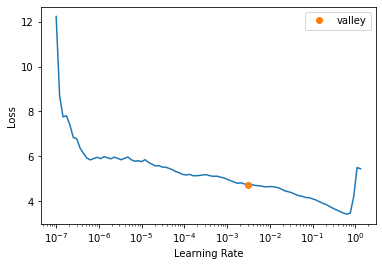

<Figure size 720x720 with 0 Axes>

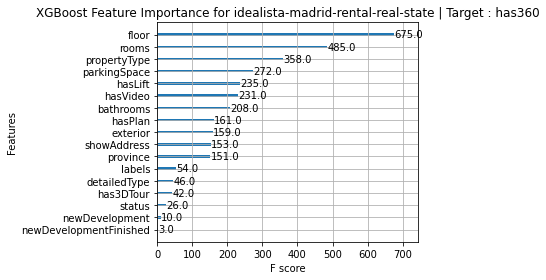

Target Variable: has3DTour
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exte

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.1915717199094492, 'Adjusted R-Squared': -0.08205015950581407, 'RMSE': 0.13399922914368614, 'Time taken': 0.021142005920410156}
{'Model': 'BaggingRegressor', 'R-Squared': 0.6930232558139533, 'Adjusted R-Squared': 0.5891234347048298, 'RMSE': 0.08257228238447706, 'Time taken': 0.02341461181640625}
{'Model': 'BayesianRidge', 'R-Squared': 0.003927557173603491, 'Adjusted R-Squared': -0.33320465424456147, 'RMSE': 0.14873973858893136, 'Time taken': 0.01126551628112793}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.4883720930232557, 'Adjusted R-Squared': 0.31520572450804996, 'RMSE': 0.10660035817780522, 'Time taken': 0.008857011795043945}
{'Model': 'DummyRegressor', 'R-Squared': -0.005879833455443517, 'Adjusted R-Squared': -0.346331469394209, 'RMSE': 0.14947019527694522, 'Time taken': 0.007849693298339844}


 17%|█▋        | 7/42 [00:00<00:00, 50.42it/s]

{'Model': 'ElasticNet', 'R-Squared': -0.005879833455443517, 'Adjusted R-Squared': -0.346331469394209, 'RMSE': 0.14947019527694522, 'Time taken': 0.009264230728149414}
{'Model': 'ElasticNetCV', 'R-Squared': 0.038164774325847195, 'Adjusted R-Squared': -0.2873794559023275, 'RMSE': 0.14616112950047147, 'Time taken': 0.05661821365356445}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -0.023255813953488635, 'Adjusted R-Squared': -0.3695885509839001, 'RMSE': 0.15075567228888181, 'Time taken': 0.009214639663696289}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.33713488372093003, 'Adjusted R-Squared': 0.11278053667262944, 'RMSE': 0.12133724602415893, 'Time taken': 0.0990748405456543}
{'Model': 'GammaRegressor', 'R-Squared': 0.019828393684798606, 'Adjusted R-Squared': -0.31192199614496174, 'RMSE': 0.1475477564367602, 'Time taken': 0.010702133178710938}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -11.266180219709971, 'Adjusted R-Squared': -15.4178104479195, 'RMSE': 0.5219587974973509, 'Tim

 40%|████      | 17/42 [00:00<00:01, 23.90it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.3284400511543579, 'Adjusted R-Squared': 0.10114283769890986, 'RMSE': 0.1221304465367325, 'Time taken': 0.17073965072631836}
{'Model': 'HuberRegressor', 'R-Squared': -0.023255814022526078, 'Adjusted R-Squared': -0.36958855107630395, 'RMSE': 0.15075567229396744, 'Time taken': 0.04205584526062012}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.20186046511627886, 'Adjusted R-Squared': -0.06827906976744202, 'RMSE': 0.13314380468978917, 'Time taken': 0.01211690902709961}
{'Model': 'KernelRidge', 'R-Squared': -47.472532580168796, 'Adjusted R-Squared': -63.87862053037976, 'RMSE': 1.0375986712382597, 'Time taken': 0.024992942810058594}
{'Model': 'Lars', 'R-Squared': 0.04616855175939116, 'Adjusted R-Squared': -0.2766667076451226, 'RMSE': 0.14555172938454458, 'Time taken': 0.02956390380859375}
{'Model': 'LarsCV', 'R-Squared': -0.005879833455443517, 'Adjusted R-Squared': -0.346331469394209, 'RMSE': 0.14947019527694522, 'Time taken': 0.0659

 50%|█████     | 21/42 [00:00<00:00, 24.60it/s]

{'Model': 'LassoCV', 'R-Squared': 0.04372439794494354, 'Adjusted R-Squared': -0.27993811351984466, 'RMSE': 0.14573809522913433, 'Time taken': 0.05646204948425293}
{'Model': 'LassoLars', 'R-Squared': -0.005879833455443517, 'Adjusted R-Squared': -0.346331469394209, 'RMSE': 0.14947019527694522, 'Time taken': 0.009444475173950195}
{'Model': 'LassoLarsCV', 'R-Squared': -0.005879833455443517, 'Adjusted R-Squared': -0.346331469394209, 'RMSE': 0.14947019527694522, 'Time taken': 0.025977611541748047}
{'Model': 'LassoLarsIC', 'R-Squared': -0.005879833455443517, 'Adjusted R-Squared': -0.346331469394209, 'RMSE': 0.14947019527694522, 'Time taken': 0.01740431785583496}
{'Model': 'LinearRegression', 'R-Squared': 0.04616855175939094, 'Adjusted R-Squared': -0.2766667076451228, 'RMSE': 0.1455517293845446, 'Time taken': 0.009733438491821289}
{'Model': 'LinearSVR', 'R-Squared': -0.023255760286985172, 'Adjusted R-Squared': -0.36958847915334925, 'RMSE': 0.15075566833555468, 'Time taken': 0.00984454154968261

 62%|██████▏   | 26/42 [00:01<00:00, 22.69it/s]

{'Model': 'MLPRegressor', 'R-Squared': -0.30981589258548636, 'Adjusted R-Squared': -0.7531381946913431, 'RMSE': 0.17056372773116074, 'Time taken': 0.18418502807617188}
{'Model': 'NuSVR', 'R-Squared': -0.018840176369476547, 'Adjusted R-Squared': -0.36367838990991475, 'RMSE': 0.15043004398115853, 'Time taken': 0.03480935096740723}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -0.007380447994396189, 'Adjusted R-Squared': -0.3483399842386532, 'RMSE': 0.14958164673915664, 'Time taken': 0.010421514511108398}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -0.011930717054263296, 'Adjusted R-Squared': -0.35443034436493703, 'RMSE': 0.14991909118426225, 'Time taken': 0.015121698379516602}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.14764287240052565, 'Adjusted R-Squared': -0.5360758445976266, 'RMSE': 0.15965588562493113, 'Time taken': 0.010944604873657227}
{'Model': 'PoissonRegressor', 'R-Squared': 0.02055051602796132, 'Adjusted R-Squared': -0.31095546316257483, 'RMSE': 0

 81%|████████  | 34/42 [00:02<00:00, 11.47it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.023255813952745452, 'Adjusted R-Squared': -0.36958855098290533, 'RMSE': 0.15075567228882705, 'Time taken': 0.8173646926879883}
{'Model': 'RANSACRegressor', 'R-Squared': -0.023255813953488635, 'Adjusted R-Squared': -0.3695885509839001, 'RMSE': 0.15075567228888181, 'Time taken': 0.016712188720703125}
{'Model': 'RandomForestRegressor', 'R-Squared': 0.7802558139534884, 'Adjusted R-Squared': 0.7058808586762075, 'RMSE': 0.06986187671528597, 'Time taken': 0.1740283966064453}
{'Model': 'Ridge', 'R-Squared': 0.04603651820407639, 'Adjusted R-Squared': -0.2768434294806976, 'RMSE': 0.14556180299206936, 'Time taken': 0.012639045715332031}
{'Model': 'RidgeCV', 'R-Squared': 0.04479849863277918, 'Adjusted R-Squared': -0.2785004710607417, 'RMSE': 0.14565622480972631, 'Time taken': 0.012776613235473633}
{'Model': 'SGDRegressor', 'R-Squared': 0.042537775576755754, 'Adjusted R-Squared': -0.2815263619203423, 'RMSE': 0.1458284888710891, 'Time taken': 0.01227092

100%|██████████| 42/42 [00:02<00:00, 16.14it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.3737753542243776, 'Adjusted R-Squared': 0.16182239719262848, 'RMSE': 0.117936075, 'Time taken': 0.29270410537719727}
{'Model': 'LGBMRegressor', 'R-Squared': 0.2948503083280479, 'Adjusted R-Squared': 0.056184258839079626, 'RMSE': 0.12514750953790593, 'Time taken': 0.04520463943481445}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: has3DTour
has3DTour
Target Standard Deviation: 0.10569653634954637
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
RandomForestRegressor                        0.71       0.78  0.07        0.17
BaggingRegressor                             0.59       0.69  0.08        0.02
DecisionTreeRegressor                        0.32       0.49  0.11        0.01
XGBRegressor                                 0.16       0.37  0.12        0.29
ExtraTreesRegressor                          0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,4.067431,0.329467,0.573992,00:00
1,4.279758,0.025517,0.159740,00:00
2,3.969108,0.108658,0.329634,00:00


Better model found at epoch 0 with _rmse value: 0.5739922523498535.
Better model found at epoch 1 with _rmse value: 0.15973985195159912.
No improvement since epoch 1: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.03
1       1       1.00
2       1       0.99
3       1       1.00
4       1       0.99
XGBoost RMSE:  0.117769614


<Figure size 432x288 with 0 Axes>

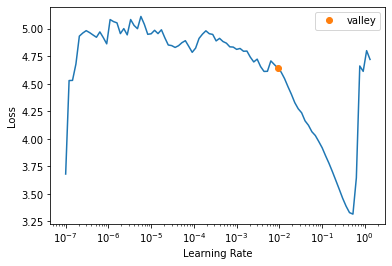

<Figure size 720x720 with 0 Axes>

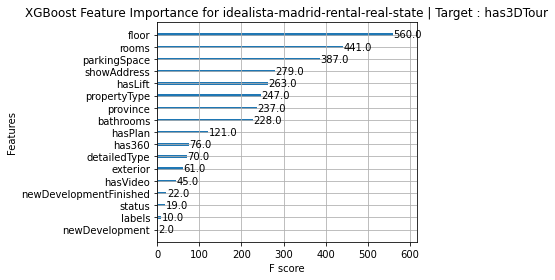

Target Variable: hasPlan
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exteri

 17%|█▋        | 7/42 [00:00<00:00, 50.40it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.5561358345185827, 'Adjusted R-Squared': 0.40590488620179543, 'RMSE': 0.30724807436822477, 'Time taken': 0.022032976150512695}
{'Model': 'BaggingRegressor', 'R-Squared': 0.45092059941613216, 'Adjusted R-Squared': 0.2650783407569769, 'RMSE': 0.3417288954881839, 'Time taken': 0.025090694427490234}
{'Model': 'BayesianRidge', 'R-Squared': 0.6068551730054134, 'Adjusted R-Squared': 0.47379077002263026, 'RMSE': 0.2891614609048634, 'Time taken': 0.011203289031982422}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.16514875531268958, 'Adjusted R-Squared': -0.11741628135070781, 'RMSE': 0.4213749140395263, 'Time taken': 0.009025096893310547}
{'Model': 'DummyRegressor', 'R-Squared': -5.600898609126048e-06, 'Adjusted R-Squared': -0.33846903504890746, 'RMSE': 0.4611745616656241, 'Time taken': 0.007815837860107422}
{'Model': 'ElasticNet', 'R-Squared': -5.600898609126048e-06, 'Adjusted R-Squared': -0.33846903504890746, 'RMSE': 0.4611745616656241, 'Time ta

 40%|████      | 17/42 [00:00<00:01, 22.09it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.5984871590971491, 'Adjusted R-Squared': 0.4625905052531073, 'RMSE': 0.29222263129431425, 'Time taken': 0.18021154403686523}
{'Model': 'HuberRegressor', 'R-Squared': 0.5193714660616923, 'Adjusted R-Squared': 0.3566971930364189, 'RMSE': 0.31971933621690835, 'Time taken': 0.05210423469543457}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.5575956284153003, 'Adjusted R-Squared': 0.4078587641866328, 'RMSE': 0.30674241488732706, 'Time taken': 0.00992894172668457}
{'Model': 'KernelRidge', 'R-Squared': -7.454719842910089, 'Adjusted R-Squared': -10.316317328202734, 'RMSE': 1.3409535615349621, 'Time taken': 0.03216385841369629}
{'Model': 'Lars', 'R-Squared': 0.6044467892481318, 'Adjusted R-Squared': 0.4705672409936533, 'RMSE': 0.29004580228131777, 'Time taken': 0.03138589859008789}


 48%|████▊     | 20/42 [00:00<00:01, 21.41it/s]

{'Model': 'LarsCV', 'R-Squared': 0.6161541354490369, 'Adjusted R-Squared': 0.48623707360101864, 'RMSE': 0.2857212624907126, 'Time taken': 0.07080602645874023}
{'Model': 'Lasso', 'R-Squared': -5.600898609126048e-06, 'Adjusted R-Squared': -0.33846903504890746, 'RMSE': 0.4611745616656241, 'Time taken': 0.012987613677978516}
{'Model': 'LassoCV', 'R-Squared': 0.615780130542344, 'Adjusted R-Squared': 0.4857364824182143, 'RMSE': 0.2858604266009591, 'Time taken': 0.058800697326660156}
{'Model': 'LassoLars', 'R-Squared': -5.600898609126048e-06, 'Adjusted R-Squared': -0.33846903504890746, 'RMSE': 0.4611745616656241, 'Time taken': 0.00958704948425293}
{'Model': 'LassoLarsCV', 'R-Squared': 0.6161541354490369, 'Adjusted R-Squared': 0.48623707360101864, 'RMSE': 0.2857212624907126, 'Time taken': 0.02373981475830078}
{'Model': 'LassoLarsIC', 'R-Squared': 0.6176180410369604, 'Adjusted R-Squared': 0.4881964549263932, 'RMSE': 0.28517590229453077, 'Time taken': 0.011714696884155273}
{'Model': 'LinearRegre

 71%|███████▏  | 30/42 [00:01<00:00, 21.61it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.5541747281670029, 'Adjusted R-Squared': 0.4032800207773731, 'RMSE': 0.307926076910592, 'Time taken': 0.3084142208099365}
{'Model': 'NuSVR', 'R-Squared': 0.6035453046514567, 'Adjusted R-Squared': 0.4693606385334883, 'RMSE': 0.29037612827643267, 'Time taken': 0.06407356262207031}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.6029807871100934, 'Adjusted R-Squared': 0.46860505351658654, 'RMSE': 0.29058279010761234, 'Time taken': 0.011425495147705078}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.617599111379066, 'Adjusted R-Squared': 0.48817111830736526, 'RMSE': 0.28518296096366424, 'Time taken': 0.022298097610473633}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.17474700195881265, 'Adjusted R-Squared': -0.10456939737820448, 'RMSE': 0.4189456474882001, 'Time taken': 0.013154983520507812}
{'Model': 'PoissonRegressor', 'R-Squared': 0.554252796402009, 'Adjusted R-Squared': 0.4033845121073043, 'RMSE': 0.3078991153414271, 'Time

 79%|███████▊  | 33/42 [00:02<00:01,  7.17it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.4426229504936936, 'Adjusted R-Squared': -0.9308953337377128, 'RMSE': 0.5539117093444157, 'Time taken': 1.1722915172576904}
{'Model': 'RANSACRegressor', 'R-Squared': 0.5594282223288012, 'Adjusted R-Squared': 0.41031162065547244, 'RMSE': 0.30610643831610657, 'Time taken': 0.12140202522277832}


 83%|████████▎ | 35/42 [00:02<00:00,  7.78it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.5577511450345205, 'Adjusted R-Squared': 0.4080669172000505, 'RMSE': 0.306688496188288, 'Time taken': 0.15000653266906738}
{'Model': 'Ridge', 'R-Squared': 0.6047091719847448, 'Adjusted R-Squared': 0.47091843019496615, 'RMSE': 0.28994958812625937, 'Time taken': 0.009741067886352539}
{'Model': 'RidgeCV', 'R-Squared': 0.606307911329903, 'Adjusted R-Squared': 0.4730582813184856, 'RMSE': 0.2893626487911849, 'Time taken': 0.010579347610473633}
{'Model': 'SGDRegressor', 'R-Squared': 0.6080744188702938, 'Adjusted R-Squared': 0.475422683718701, 'RMSE': 0.28871272972425877, 'Time taken': 0.00895237922668457}
{'Model': 'SVR', 'R-Squared': 0.6190344211506438, 'Adjusted R-Squared': 0.49009222523240015, 'RMSE': 0.2846472526037931, 'Time taken': 0.013949394226074219}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.6044467892481318, 'Adjusted R-Squared': 0.4705672409936533, 'RMSE': 0.29004580228131777, 'Time taken': 0.010982990264892578}
{'Model'

100%|██████████| 42/42 [00:03<00:00, 12.77it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.5514188381938023, 'Adjusted R-Squared': 0.3995913680440124, 'RMSE': 0.30887637, 'Time taken': 0.310192346572876}
{'Model': 'LGBMRegressor', 'R-Squared': 0.5981819597014786, 'Adjusted R-Squared': 0.4621820076004406, 'RMSE': 0.2923336728597362, 'Time taken': 0.06865906715393066}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: hasPlan
hasPlan
Target Standard Deviation: 0.4616289418615891
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
GradientBoostingRegressor                    0.52       0.64  0.28        0.11
SVR                                          0.49       0.62  0.28        0.01
LassoLarsIC                                  0.49       0.62  0.29        0.01
OrthogonalMatchingPursuitCV                  0.49       0.62  0.29        0.02
LassoLarsCV                                  0.49       0.

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,13.436870,0.389064,0.623750,00:00
1,10.585456,0.641983,0.801238,00:00


Better model found at epoch 0 with _rmse value: 0.6237496733665466.
No improvement since epoch 0: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.16
1       1       1.09
2       1       1.00
3       1       1.03
4       1       0.99
XGBoost RMSE:  0.30490676


<Figure size 432x288 with 0 Axes>

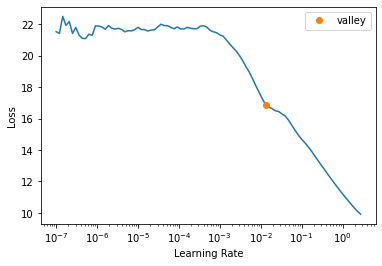

<Figure size 720x720 with 0 Axes>

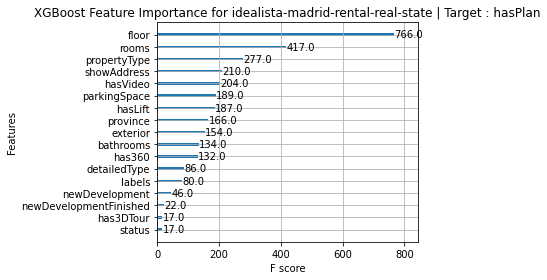

Target Variable: priceByArea
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'district', 'neighborhood']
31
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms',

 17%|█▋        | 7/42 [00:00<00:00, 47.51it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.4641924263389431, 'Adjusted R-Squared': 0.2716365795545007, 'RMSE': 3.694480482420856, 'Time taken': 0.028453588485717773}
{'Model': 'BaggingRegressor', 'R-Squared': 0.30176308991801826, 'Adjusted R-Squared': 0.050834200357306014, 'RMSE': 4.217453994687195, 'Time taken': 0.027989625930786133}
{'Model': 'BayesianRidge', 'R-Squared': 0.45789480167871477, 'Adjusted R-Squared': 0.2630757460320029, 'RMSE': 3.716128631591498, 'Time taken': 0.008898735046386719}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.3307957462319543, 'Adjusted R-Squared': 0.09030046753406284, 'RMSE': 4.12884233353025, 'Time taken': 0.0093994140625}
{'Model': 'DummyRegressor', 'R-Squared': -0.0013805367686396952, 'Adjusted R-Squared': -0.36125166716986956, 'RMSE': 5.050665, 'Time taken': 0.007832050323486328}
{'Model': 'ElasticNet', 'R-Squared': 0.4027390499348821, 'Adjusted R-Squared': 0.18809839600523037, 'RMSE': 3.900596375821923, 'Time taken': 0.008575439453125}
{'M

 29%|██▊       | 12/42 [00:00<00:01, 26.25it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.3911125084796786, 'Adjusted R-Squared': 0.17229356621456304, 'RMSE': 3.938378742933493, 'Time taken': 0.14819931983947754}
{'Model': 'GammaRegressor', 'R-Squared': 0.49235067731767157, 'Adjusted R-Squared': 0.3099142019787098, 'RMSE': 3.5960925312560295, 'Time taken': 0.01145172119140625}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -1.8723503610222632, 'Adjusted R-Squared': -2.904601272014639, 'RMSE': 8.55396874196465, 'Time taken': 0.039629220962524414}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.5976265479911986, 'Adjusted R-Squared': 0.4530235886755356, 'RMSE': 3.2015744981541965, 'Time taken': 0.06272101402282715}


 48%|████▊     | 20/42 [00:00<00:00, 24.38it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.49044354183616556, 'Adjusted R-Squared': 0.30732168968353757, 'RMSE': 3.6028410938719966, 'Time taken': 0.1863400936126709}
{'Model': 'HuberRegressor', 'R-Squared': 0.4610564108459656, 'Adjusted R-Squared': 0.26737355849373445, 'RMSE': 3.7052763774867397, 'Time taken': 0.01612091064453125}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.4254758230101525, 'Adjusted R-Squared': 0.21900619690442613, 'RMSE': 3.8256314, 'Time taken': 0.010545492172241211}
{'Model': 'KernelRidge', 'R-Squared': -4.8553551714226115, 'Adjusted R-Squared': -6.959623436152612, 'RMSE': 12.213090471171121, 'Time taken': 0.028391599655151367}
{'Model': 'Lars', 'R-Squared': 0.4105430668325526, 'Adjusted R-Squared': 0.19870698147550114, 'RMSE': 3.8750293176271087, 'Time taken': 0.01472330093383789}
{'Model': 'LarsCV', 'R-Squared': 0.4169414600864716, 'Adjusted R-Squared': 0.20740479730504735, 'RMSE': 3.8539407438715214, 'Time taken': 0.029204130172729492}
{'Mod

 62%|██████▏   | 26/42 [00:01<00:00, 16.67it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.4524523035286272, 'Adjusted R-Squared': 0.25567735010922754, 'RMSE': 3.734736195129606, 'Time taken': 0.440448522567749}
{'Model': 'NuSVR', 'R-Squared': 0.4175503543920247, 'Adjusted R-Squared': 0.20823251300165857, 'RMSE': 3.851927862326761, 'Time taken': 0.020273447036743164}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.15334640288939205, 'Adjusted R-Squared': -0.15091973357223276, 'RMSE': 4.64410287395348, 'Time taken': 0.011440753936767578}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.28769600451472055, 'Adjusted R-Squared': 0.03171175613719823, 'RMSE': 4.259725784417349, 'Time taken': 0.017987728118896484}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.1421493087908101, 'Adjusted R-Squared': -0.5526092166375074, 'RMSE': 5.393993181856458, 'Time taken': 0.01211237907409668}
{'Model': 'PoissonRegressor', 'R-Squared': 0.5346822318720514, 'Adjusted R-Squared': 0.3674586589510699, 'RMSE': 3.442894942360856, 'Time tak

 76%|███████▌  | 32/42 [00:02<00:01,  7.14it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.0255536722857852, 'Adjusted R-Squared': -0.39411202326348915, 'RMSE': 5.111262075065099, 'Time taken': 1.5501019954681396}
{'Model': 'RANSACRegressor', 'R-Squared': -5.020582339612563e+24, 'Adjusted R-Squared': -6.824854117910828e+24, 'RMSE': 11309046754631.496, 'Time taken': 0.12883305549621582}


 81%|████████  | 34/42 [00:03<00:01,  7.11it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.42911138784639635, 'Adjusted R-Squared': 0.223948292853695, 'RMSE': 3.813507830671071, 'Time taken': 0.15747928619384766}
{'Model': 'Ridge', 'R-Squared': 0.4415772120751217, 'Adjusted R-Squared': 0.24089402266461857, 'RMSE': 3.7716424820042747, 'Time taken': 0.011638879776000977}
{'Model': 'RidgeCV', 'R-Squared': 0.4510917057418208, 'Adjusted R-Squared': 0.25382778749278767, 'RMSE': 3.7393735272009825, 'Time taken': 0.009681463241577148}
{'Model': 'SGDRegressor', 'R-Squared': 0.44183824171784714, 'Adjusted R-Squared': 0.2412488598351985, 'RMSE': 3.770760869015095, 'Time taken': 0.010780572891235352}
{'Model': 'SVR', 'R-Squared': 0.4360482207351042, 'Adjusted R-Squared': 0.23337805006178225, 'RMSE': 3.7902681678365924, 'Time taken': 0.01650857925415039}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.44031224433031624, 'Adjusted R-Squared': 0.23917445713652363, 'RMSE': 3.7759119238699825, 'Time taken': 0.008778810501098633}
{'Mode

100%|██████████| 42/42 [00:03<00:00, 11.56it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.45107020117860774, 'Adjusted R-Squared': 0.25379855472716994, 'RMSE': 3.7394469, 'Time taken': 0.2968876361846924}
{'Model': 'LGBMRegressor', 'R-Squared': 0.48673030156833474, 'Adjusted R-Squared': 0.302274003694455, 'RMSE': 3.615944578658701, 'Time taken': 0.04193592071533203}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: priceByArea
priceByArea
Target Standard Deviation: 5.480316162109375
                                         Adjusted R-Squared  \
Model                                                         
GradientBoostingRegressor                              0.45   
PoissonRegressor                                       0.37   
GammaRegressor                                         0.31   
HistGradientBoostingRegressor                          0.31   
LGBMRegressor                                          0.30   
AdaBoostRegressor                                      0.27   
ElasticNetCV        

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,202.948273,144.700821,12.029165,00:00
1,140.837173,75.828979,8.707983,00:00
2,114.408020,38.551979,6.209023,00:00
3,91.264977,39.235065,6.263790,00:00


Better model found at epoch 0 with _rmse value: 12.029165267944336.
Better model found at epoch 1 with _rmse value: 8.707983016967773.
Better model found at epoch 2 with _rmse value: 6.209023475646973.
No improvement since epoch 2: early stopping


,propertyType,operation,exterior,rooms,bathrooms,province,country,showAddress,hasVideo,status,newDevelopment,detailedType,hasPlan,has3DTour,has360,hasStaging,superTopHighlight,topNewDevelopment,floor,hasLift,parkingSpace,labels,newDevelopmentFinished,priceByArea,priceByArea_pred
0,4.00,1.00,2.00,2.00,1.00,4.00,1.00,2.00,2.00,1.00,1.00,10.00,2.00,1.00,1.00,1.00,1.00,1.00,2.00,2.00,1.00,1.00,1.00,7.00,8.57
1,4.00,1.00,2.00,4.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,2.00,1.00,2.00,1.00,1.00,1.00,6.00,1.00,1.00,1.00,1.00,13.00,8.32
2,4.00,1.00,2.00,3.00,2.00,2.00,1.00,2.00,1.00,1.00,1.00,10.00,1.00,1.00,2.00,1.00,1.00,1.00,4.00,2.00,1.00,1.00,1.00,8.00,8.18
3,4.00,1.00,2.00,3.00,2.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,4.00,2.00,1.00,1.00,1.00,6.00,8.15
4,4.00,1.00,1.00,3.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,2.00,1.00,2.00,1.00,1.00,1.00,6.00,1.00,1.00,1.00,1.00,12.00,8.45
5,6.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,9.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,6.00,1.00,1.00,17.00,8.11
6,4.00,1.00,1.00,3.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,2.00,1.00,2.00,1.00,1.00,1.00,6.00,1.00,1.00,1.00,1.00,14.00,8.45
7,2.00,1.00,1.00,3.00,2.00,2.00,1.00,2.00,2.00,3.00,1.00,6.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,10.00,8.51
8,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,5.00,2.00,6.00,1.00,1.00,9.00,8.12


<Figure size 432x288 with 0 Axes>

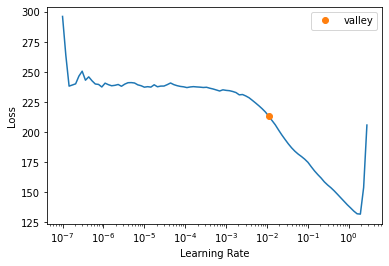

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0   10.00      11.76
1    8.00       7.76
2   25.00      15.79
3    1.00       7.51
4   11.00      11.76
XGBoost RMSE:  3.7393956


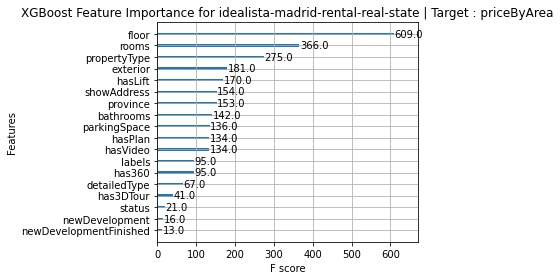

Target Variable: newDevelopment
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 

 17%|█▋        | 7/42 [00:00<00:00, 54.71it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -0.011494252873563093, 'Adjusted R-Squared': -0.3538461538461535, 'RMSE': 0.10660035817780522, 'Time taken': 0.012783527374267578}
{'Model': 'BaggingRegressor', 'R-Squared': 0.5043678160919541, 'Adjusted R-Squared': 0.33661538461538476, 'RMSE': 0.07462025072446365, 'Time taken': 0.02475571632385254}
{'Model': 'BayesianRidge', 'R-Squared': -0.14153583379955004, 'Adjusted R-Squared': -0.5279018083163207, 'RMSE': 0.11324570209023949, 'Time taken': 0.009596824645996094}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.011494252873563093, 'Adjusted R-Squared': -0.3538461538461535, 'RMSE': 0.10660035817780522, 'Time taken': 0.008360147476196289}
{'Model': 'DummyRegressor', 'R-Squared': -0.045201042110372125, 'Adjusted R-Squared': -0.39896139482465176, 'RMSE': 0.10836196485207135, 'Time taken': 0.007692098617553711}
{'Model': 'ElasticNet', 'R-Squared': -0.045201042110372125, 'Adjusted R-Squared': -0.39896139482465176, 'RMSE': 0.10836196485207135, 

 40%|████      | 17/42 [00:00<00:01, 24.46it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.41437015661918564, 'Adjusted R-Squared': 0.21615697885952545, 'RMSE': 0.08111264325257678, 'Time taken': 0.2200615406036377}
{'Model': 'HuberRegressor', 'R-Squared': -1.80070040659357, 'Adjusted R-Squared': -2.7486297749790856, 'RMSE': 0.17738229982446851, 'Time taken': 0.04553627967834473}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.35264367816091946, 'Adjusted R-Squared': 0.1335384615384615, 'RMSE': 0.08528028654224418, 'Time taken': 0.010624170303344727}
{'Model': 'KernelRidge', 'R-Squared': -91.47155892716168, 'Adjusted R-Squared': -122.76962502558563, 'RMSE': 1.0192507595685558, 'Time taken': 0.02691960334777832}
{'Model': 'Lars', 'R-Squared': -0.19445076732613886, 'Adjusted R-Squared': -0.5987264116519089, 'RMSE': 0.11584067541788799, 'Time taken': 0.030549287796020508}
{'Model': 'LarsCV', 'R-Squared': -0.004963909311006542, 'Adjusted R-Squared': -0.3451055401547318, 'RMSE': 0.10625568780963178, 'Time taken': 0.0657870

 50%|█████     | 21/42 [00:00<00:00, 24.83it/s]

{'Model': 'Lasso', 'R-Squared': -0.045201042110372125, 'Adjusted R-Squared': -0.39896139482465176, 'RMSE': 0.10836196485207135, 'Time taken': 0.015227556228637695}
{'Model': 'LassoCV', 'R-Squared': 0.07569278988747885, 'Adjusted R-Squared': -0.2371496504582975, 'RMSE': 0.10190256705039576, 'Time taken': 0.05655479431152344}
{'Model': 'LassoLars', 'R-Squared': -0.045201042110372125, 'Adjusted R-Squared': -0.39896139482465176, 'RMSE': 0.10836196485207135, 'Time taken': 0.010937213897705078}
{'Model': 'LassoLarsCV', 'R-Squared': -0.004963909311006542, 'Adjusted R-Squared': -0.3451055401547318, 'RMSE': 0.10625568780963178, 'Time taken': 0.025424718856811523}
{'Model': 'LassoLarsIC', 'R-Squared': -0.16616127554541515, 'Adjusted R-Squared': -0.5608620149607864, 'RMSE': 0.11446066428674619, 'Time taken': 0.01178431510925293}
{'Model': 'LinearRegression', 'R-Squared': -0.19445076732615352, 'Adjusted R-Squared': -0.5987264116519284, 'RMSE': 0.11584067541788871, 'Time taken': 0.00883793830871582

 74%|███████▍  | 31/42 [00:01<00:00, 26.03it/s]

{'Model': 'MLPRegressor', 'R-Squared': -0.48876286285896575, 'Adjusted R-Squared': -0.9926518318266155, 'RMSE': 0.1293271531222338, 'Time taken': 0.24771571159362793}
{'Model': 'NuSVR', 'R-Squared': 0.9279628110955435, 'Adjusted R-Squared': 0.9035809933124966, 'RMSE': 0.02844823538326149, 'Time taken': 0.04268956184387207}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -0.24561988118851086, 'Adjusted R-Squared': -0.6672143025138528, 'RMSE': 0.11829590737807424, 'Time taken': 0.01065683364868164}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -1.3305009155013718, 'Adjusted R-Squared': -2.11928584074799, 'RMSE': 0.16180859731599317, 'Time taken': 0.015233993530273438}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.21520435583014685, 'Adjusted R-Squared': -0.05041878527349564, 'RMSE': 0.09389776305846388, 'Time taken': 0.014145612716674805}
{'Model': 'PoissonRegressor', 'R-Squared': 0.5136304085905907, 'Adjusted R-Squared': 0.34901300842125227, 'RMSE': 0.07391969415846

 83%|████████▎ | 35/42 [00:02<00:00,  7.75it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.5043678160919541, 'Adjusted R-Squared': 0.33661538461538476, 'RMSE': 0.07462025072446365, 'Time taken': 0.17114996910095215}
{'Model': 'Ridge', 'R-Squared': -0.18536560907504707, 'Adjusted R-Squared': -0.5865662767619859, 'RMSE': 0.1153992843710853, 'Time taken': 0.011615753173828125}
{'Model': 'RidgeCV', 'R-Squared': -0.1109661641991837, 'Adjusted R-Squared': -0.48698548131275343, 'RMSE': 0.11171908504129903, 'Time taken': 0.012819051742553711}
{'Model': 'SGDRegressor', 'R-Squared': -0.013382536793973276, 'Adjusted R-Squared': -0.3563735492473179, 'RMSE': 0.1066998139508361, 'Time taken': 0.010418415069580078}
{'Model': 'SVR', 'R-Squared': 0.21404407734825803, 'Adjusted R-Squared': -0.05197177339540837, 'RMSE': 0.09396714883821229, 'Time taken': 0.011003732681274414}
{'Model': 'TransformedTargetRegressor', 'R-Squared': -0.19445076732615352, 'Adjusted R-Squared': -0.5987264116519284, 'RMSE': 0.11584067541788871, 'Time taken': 0.01092410

 98%|█████████▊| 41/42 [00:02<00:00,  9.95it/s]

{'Model': 'XGBRegressor', 'R-Squared': -0.010794419090681462, 'Adjusted R-Squared': -0.35290945324445055, 'RMSE': 0.10656347, 'Time taken': 0.2643265724182129}


100%|██████████| 42/42 [00:03<00:00, 12.48it/s]

{'Model': 'LGBMRegressor', 'R-Squared': 0.3371866102749289, 'Adjusted R-Squared': 0.11284977067567414, 'RMSE': 0.08629240850598978, 'Time taken': 0.3760199546813965}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: newDevelopment
newDevelopment
Target Standard Deviation: 0.1809674280005307
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
NuSVR                                        0.90       0.93  0.03        0.04
ExtraTreesRegressor                          0.65       0.74  0.05        0.09
GammaRegressor                               0.39       0.54  0.07        0.01
GradientBoostingRegressor                    0.36       0.52  0.07        0.06
TweedieRegressor                             0.35       0.52  0.07        0.01
PoissonRegressor                             0.35       0.51  0.07        0.02
RandomForestRegressor                  

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,4.550620,0.785679,0.886385,00:00
1,3.889601,0.027580,0.166071,00:00
2,3.284218,0.138665,0.372378,00:00


Better model found at epoch 0 with _rmse value: 0.8863852024078369.
Better model found at epoch 1 with _rmse value: 0.16607128083705902.
No improvement since epoch 1: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  0.10656347


<Figure size 432x288 with 0 Axes>

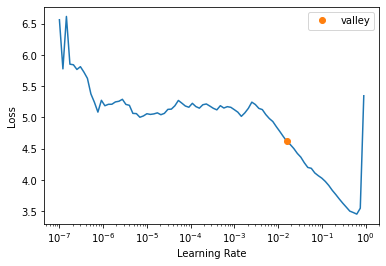

<Figure size 720x720 with 0 Axes>

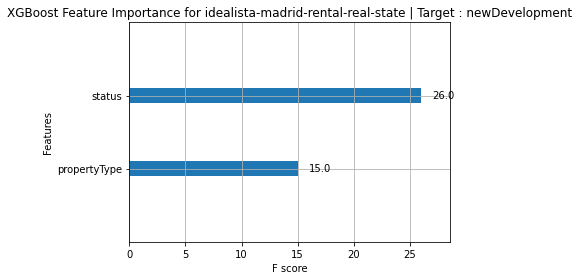

Target Variable: hasVideo
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exter

 14%|█▍        | 6/42 [00:00<00:00, 59.95it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.43825041111497354, 'Adjusted R-Squared': 0.24811978103081078, 'RMSE': 0.3194741756547516, 'Time taken': 0.0331881046295166}
{'Model': 'BaggingRegressor', 'R-Squared': 0.5092205889889714, 'Adjusted R-Squared': 0.343110634492931, 'RMSE': 0.29861219791453913, 'Time taken': 0.02566361427307129}
{'Model': 'BayesianRidge', 'R-Squared': 0.6638049113977855, 'Adjusted R-Squared': 0.5500158044862669, 'RMSE': 0.24714968364106513, 'Time taken': 0.009879112243652344}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.07225775882492291, 'Adjusted R-Squared': -0.24174730741894934, 'RMSE': 0.4105613304496736, 'Time taken': 0.009361505508422852}
{'Model': 'DummyRegressor', 'R-Squared': -0.011990248708124707, 'Adjusted R-Squared': -0.3545100251939515, 'RMSE': 0.4287977920638877, 'Time taken': 0.009828567504882812}
{'Model': 'ElasticNet', 'R-Squared': -0.011990248708124707, 'Adjusted R-Squared': -0.3545100251939515, 'RMSE': 0.4287977920638877, 'Time taken': 0.

 29%|██▊       | 12/42 [00:00<00:01, 24.03it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.6647984229729902, 'Adjusted R-Squared': 0.5513455815176946, 'RMSE': 0.2467842295407593, 'Time taken': 0.08927297592163086}


 38%|███▊      | 16/42 [00:00<00:01, 18.87it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.6122186382637615, 'Adjusted R-Squared': 0.4809695619838039, 'RMSE': 0.2654347887171598, 'Time taken': 0.20782947540283203}
{'Model': 'HuberRegressor', 'R-Squared': 0.5622129023821716, 'Adjusted R-Squared': 0.41403880780382973, 'RMSE': 0.28203035596817716, 'Time taken': 0.051320552825927734}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.6197299218194741, 'Adjusted R-Squared': 0.4910231261276038, 'RMSE': 0.26285149626910836, 'Time taken': 0.013525009155273438}
{'Model': 'KernelRidge', 'R-Squared': -7.610324267984282, 'Adjusted R-Squared': -10.524587866378962, 'RMSE': 1.2507604218570494, 'Time taken': 0.01792740821838379}
{'Model': 'Lars', 'R-Squared': 0.6662669838762806, 'Adjusted R-Squared': 0.5533111938036371, 'RMSE': 0.24624303952649515, 'Time taken': 0.015358686447143555}
{'Model': 'LarsCV', 'R-Squared': 0.6526549858141681, 'Adjusted R-Squared': 0.5350920579358867, 'RMSE': 0.2512146204067934, 'Time taken': 0.0539669990539550

 48%|████▊     | 20/42 [00:00<00:01, 20.44it/s]

{'Model': 'LassoCV', 'R-Squared': 0.6545504356031557, 'Adjusted R-Squared': 0.5376290445765315, 'RMSE': 0.25052824797900275, 'Time taken': 0.06497764587402344}
{'Model': 'LassoLars', 'R-Squared': -0.011990248708124707, 'Adjusted R-Squared': -0.3545100251939515, 'RMSE': 0.4287977920638877, 'Time taken': 0.009487628936767578}
{'Model': 'LassoLarsCV', 'R-Squared': 0.6526549858141681, 'Adjusted R-Squared': 0.5350920579358867, 'RMSE': 0.2512146204067934, 'Time taken': 0.02482461929321289}
{'Model': 'LassoLarsIC', 'R-Squared': 0.6656552012340309, 'Adjusted R-Squared': 0.5524923462670875, 'RMSE': 0.24646863638619637, 'Time taken': 0.015107154846191406}
{'Model': 'LinearRegression', 'R-Squared': 0.6662669838762809, 'Adjusted R-Squared': 0.5533111938036376, 'RMSE': 0.246243039526495, 'Time taken': 0.009177923202514648}
{'Model': 'LinearSVR', 'R-Squared': 0.5621887819671425, 'Adjusted R-Squared': 0.4140065235560215, 'RMSE': 0.2820381252646865, 'Time taken': 0.01313924789428711}


 69%|██████▉   | 29/42 [00:01<00:00, 17.56it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.6554504627092241, 'Adjusted R-Squared': 0.538833696241577, 'RMSE': 0.25020167458657183, 'Time taken': 0.4335005283355713}
{'Model': 'NuSVR', 'R-Squared': 0.6979501167089597, 'Adjusted R-Squared': 0.595717848518146, 'RMSE': 0.23426300651819948, 'Time taken': 0.07226371765136719}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.6380886821910096, 'Adjusted R-Squared': 0.5155956207787359, 'RMSE': 0.25642800815709155, 'Time taken': 0.011304855346679688}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.672144093068697, 'Adjusted R-Squared': 0.5611774784150253, 'RMSE': 0.24406521286688768, 'Time taken': 0.01663827896118164}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.7443661513466875, 'Adjusted R-Squared': -1.33476700257172, 'RMSE': 0.5629673420097505, 'Time taken': 0.011531352996826172}
{'Model': 'PoissonRegressor', 'R-Squared': 0.5949253906888616, 'Adjusted R-Squared': 0.45782321522970715, 'RMSE': 0.2712888143242837, 'Time tak

 76%|███████▌  | 32/42 [00:02<00:01,  7.99it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.3134328356464149, 'Adjusted R-Squared': -0.7579793338652014, 'RMSE': 0.4885042104267499, 'Time taken': 0.9705569744110107}
{'Model': 'RANSACRegressor', 'R-Squared': 0.46121301545501436, 'Adjusted R-Squared': 0.27885434376286544, 'RMSE': 0.3128764854566477, 'Time taken': 0.12666749954223633}


 81%|████████  | 34/42 [00:02<00:01,  7.86it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.5408864299175934, 'Adjusted R-Squared': 0.3854941446589327, 'RMSE': 0.28881812304747173, 'Time taken': 0.143906831741333}
{'Model': 'Ridge', 'R-Squared': 0.6662625783710224, 'Adjusted R-Squared': 0.5533052972042916, 'RMSE': 0.24624466480983978, 'Time taken': 0.010683298110961914}
{'Model': 'RidgeCV', 'R-Squared': 0.6659426385725891, 'Adjusted R-Squared': 0.5528770700894654, 'RMSE': 0.24636266865175147, 'Time taken': 0.009510993957519531}
{'Model': 'SGDRegressor', 'R-Squared': 0.66780066225465, 'Adjusted R-Squared': 0.5553639633254546, 'RMSE': 0.24567657997519693, 'Time taken': 0.009316205978393555}
{'Model': 'SVR', 'R-Squared': 0.6830390112893959, 'Adjusted R-Squared': 0.5757599074181146, 'RMSE': 0.23997570876010504, 'Time taken': 0.014491796493530273}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.6662669838762809, 'Adjusted R-Squared': 0.5533111938036376, 'RMSE': 0.246243039526495, 'Time taken': 0.009308815002441406}
{'Model':

100%|██████████| 42/42 [00:03<00:00, 13.10it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.45406274931828394, 'Adjusted R-Squared': 0.2692839875490878, 'RMSE': 0.31494576, 'Time taken': 0.30756640434265137}
{'Model': 'LGBMRegressor', 'R-Squared': 0.6117646168636957, 'Adjusted R-Squared': 0.48036187180217726, 'RMSE': 0.2655901311758276, 'Time taken': 0.04639887809753418}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: hasVideo
hasVideo
Target Standard Deviation: 0.4515623093918517
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
NuSVR                                        0.60       0.70  0.23        0.07
SVR                                          0.58       0.68  0.24        0.01
OrthogonalMatchingPursuitCV                  0.56       0.67  0.24        0.02
SGDRegressor                                 0.56       0.67  0.25        0.01
TransformedTargetRegressor                   0.55   

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,6.222751,0.536419,0.732406,00:00
1,5.282514,0.701224,0.837391,00:00


Better model found at epoch 0 with _rmse value: 0.7324063777923584.
No improvement since epoch 0: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.08
1       2       1.70
2       2       1.89
3       1       1.01
4       1       0.96
XGBoost RMSE:  0.31741405


<Figure size 432x288 with 0 Axes>

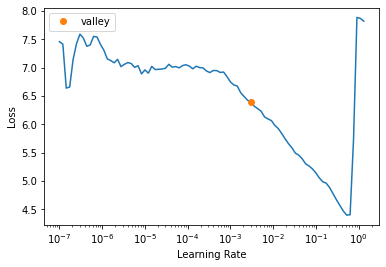

<Figure size 720x720 with 0 Axes>

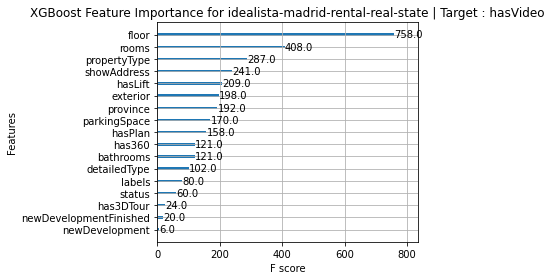

Target Variable: distance
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'priceByArea', 'district', 'neighborhood']
31
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior', 'rooms', 'bathroom

 17%|█▋        | 7/42 [00:00<00:00, 44.39it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.5467179770229856, 'Adjusted R-Squared': 0.3838197500156211, 'RMSE': 11009.785005363268, 'Time taken': 0.03517436981201172}
{'Model': 'BaggingRegressor', 'R-Squared': 0.6319340327427807, 'Adjusted R-Squared': 0.4996603257597175, 'RMSE': 9921.045057469335, 'Time taken': 0.02621006965637207}
{'Model': 'BayesianRidge', 'R-Squared': 0.4337613517286495, 'Adjusted R-Squared': 0.23026933750613288, 'RMSE': 12305.360599116777, 'Time taken': 0.009220123291015625}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.43624141779398473, 'Adjusted R-Squared': 0.23364067731369798, 'RMSE': 12278.382930559686, 'Time taken': 0.008976936340332031}
{'Model': 'DummyRegressor', 'R-Squared': -0.00020126960415356443, 'Adjusted R-Squared': -0.3596486008681463, 'RMSE': 16354.539, 'Time taken': 0.00740814208984375}
{'Model': 'ElasticNet', 'R-Squared': 0.43578618878256103, 'Adjusted R-Squared': 0.23302185037629386, 'RMSE': 12283.339261509294, 'Time taken': 0.0080833435058

 29%|██▊       | 12/42 [00:00<00:01, 22.41it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.5757142451291745, 'Adjusted R-Squared': 0.42323655197247156, 'RMSE': 10651.819930018803, 'Time taken': 0.15305566787719727}
{'Model': 'GammaRegressor', 'R-Squared': 0.37153745734158694, 'Adjusted R-Squared': 0.1456837310737198, 'RMSE': 12963.858727584331, 'Time taken': 0.014156103134155273}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -0.6933295047906081, 'Adjusted R-Squared': -1.3018697955747327, 'RMSE': 21279.691544548557, 'Time taken': 0.03718066215515137}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.7002534075560699, 'Adjusted R-Squared': 0.5925319758965325, 'RMSE': 8953.064596829705, 'Time taken': 0.11265754699707031}


 43%|████▎     | 18/42 [00:00<00:01, 20.52it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.62845798055434, 'Adjusted R-Squared': 0.49493506731605597, 'RMSE': 9967.782644189423, 'Time taken': 0.16657495498657227}
{'Model': 'HuberRegressor', 'R-Squared': 0.45270462612141404, 'Adjusted R-Squared': 0.2560203511337972, 'RMSE': 12097.77433648648, 'Time taken': 0.01904582977294922}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.47140558758593554, 'Adjusted R-Squared': 0.28144197062463117, 'RMSE': 11889.289, 'Time taken': 0.010252237319946289}
{'Model': 'KernelRidge', 'R-Squared': -0.9255648118063018, 'Adjusted R-Squared': -1.6175646660491916, 'RMSE': 22692.04630419879, 'Time taken': 0.026333093643188477}
{'Model': 'Lars', 'R-Squared': 0.4233148130962048, 'Adjusted R-Squared': 0.21606857405265334, 'RMSE': 12418.352651694666, 'Time taken': 0.029923677444458008}
{'Model': 'LarsCV', 'R-Squared': 0.43362975865946474, 'Adjusted R-Squared': 0.23009045317770993, 'RMSE': 12306.790390339755, 'Time taken': 0.07256793975830078}
{'Model

 52%|█████▏    | 22/42 [00:00<00:00, 24.06it/s]

{'Model': 'LassoCV', 'R-Squared': 0.4275798030946699, 'Adjusted R-Squared': 0.22186629483181697, 'RMSE': 12372.34623295108, 'Time taken': 0.057058095932006836}
{'Model': 'LassoLars', 'R-Squared': 0.42428712080932307, 'Adjusted R-Squared': 0.21739030485017352, 'RMSE': 12407.879386464316, 'Time taken': 0.013719797134399414}
{'Model': 'LassoLarsCV', 'R-Squared': 0.43337931080508707, 'Adjusted R-Squared': 0.2297500006256652, 'RMSE': 12309.511109368686, 'Time taken': 0.026805400848388672}
{'Model': 'LassoLarsIC', 'R-Squared': 0.42724901942099236, 'Adjusted R-Squared': 0.22141663577541149, 'RMSE': 12375.920512029514, 'Time taken': 0.012605667114257812}
{'Model': 'LinearRegression', 'R-Squared': 0.42331481309620445, 'Adjusted R-Squared': 0.2160685740526529, 'RMSE': 12418.352651694668, 'Time taken': 0.00878763198852539}
{'Model': 'LinearSVR', 'R-Squared': -1.7652003081662375, 'Adjusted R-Squared': -2.7589441689134793, 'RMSE': 27193.04797729476, 'Time taken': 0.008652925491333008}


 74%|███████▍  | 31/42 [00:01<00:00, 21.46it/s]

{'Model': 'MLPRegressor', 'R-Squared': -1.7990142438990495, 'Adjusted R-Squared': -2.8049099878002703, 'RMSE': 27358.806316482678, 'Time taken': 0.3823535442352295}
{'Model': 'NuSVR', 'R-Squared': -0.00462013866798161, 'Adjusted R-Squared': -0.36565550100178745, 'RMSE': 16390.62561552858, 'Time taken': 0.022281646728515625}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.29605678690534276, 'Adjusted R-Squared': 0.04307719469945037, 'RMSE': 13720.29356108061, 'Time taken': 0.01075434684753418}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.3894442762376946, 'Adjusted R-Squared': 0.17002581301061614, 'RMSE': 12777.834067568934, 'Time taken': 0.015938520431518555}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.4537119641904789, 'Adjusted R-Squared': 0.25738970132143224, 'RMSE': 12086.635779546225, 'Time taken': 0.03479456901550293}
{'Model': 'PoissonRegressor', 'R-Squared': 0.232321734850379, 'Adjusted R-Squared': -0.043562641687766135, 'RMSE': 14327.955138256295, '

 83%|████████▎ | 35/42 [00:04<00:01,  4.41it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.6412229061880682, 'Adjusted R-Squared': 0.5122873880994052, 'RMSE': 9795.056477452903, 'Time taken': 0.15913128852844238}
{'Model': 'Ridge', 'R-Squared': 0.42371798042265785, 'Adjusted R-Squared': 0.21661662963705053, 'RMSE': 12414.01098529392, 'Time taken': 0.00963902473449707}
{'Model': 'RidgeCV', 'R-Squared': 0.42691628710477203, 'Adjusted R-Squared': 0.22096432778304953, 'RMSE': 12379.514806020159, 'Time taken': 0.011451005935668945}
{'Model': 'SGDRegressor', 'R-Squared': 0.42414947654242696, 'Adjusted R-Squared': 0.2172031946748616, 'RMSE': 12409.3625662351, 'Time taken': 0.011837244033813477}
{'Model': 'SVR', 'R-Squared': -0.011415493136511357, 'Adjusted R-Squared': -0.3748929359824451, 'RMSE': 16445.96613400434, 'Time taken': 0.017615079879760742}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.42331481309620445, 'Adjusted R-Squared': 0.2160685740526529, 'RMSE': 12418.352651694668, 'Time taken': 0.009751319885253906}
{'Mod

100%|██████████| 42/42 [00:04<00:00,  9.53it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.5700601318571484, 'Adjusted R-Squared': 0.41555049174331116, 'RMSE': 10722.56, 'Time taken': 0.2804677486419678}
{'Model': 'LGBMRegressor', 'R-Squared': 0.6227903447229652, 'Adjusted R-Squared': 0.4872306248577809, 'RMSE': 10043.520976339101, 'Time taken': 0.04282546043395996}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: distance
distance
Target Standard Deviation: 17122.16015625
                               Adjusted R-Squared  R-Squared     RMSE  \
Model                                                                   
GradientBoostingRegressor                    0.59       0.70  8953.06   
RandomForestRegressor                        0.51       0.64  9795.06   
BaggingRegressor                             0.50       0.63  9921.05   
HistGradientBoostingRegressor                0.49       0.63  9967.78   
LGBMRegressor                                0.49       0.62 10043.52   
ExtraTreesRegressor    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,765788160.000000,754933696.000000,27476.056641,00:00
1,779981120.000000,754759104.000000,27472.880859,00:00
2,787749312.000000,754082048.000000,27460.554688,00:00
3,787616192.000000,750563072.000000,27396.406250,00:00
4,789528448.000000,714518080.000000,26730.470703,00:00
5,782095872.000000,648167808.000000,25459.140625,00:00
6,766104320.000000,555142080.000000,23561.453125,00:00
7,739903168.000000,589189056.000000,24273.216797,00:00


Better model found at epoch 0 with _rmse value: 27476.056640625.
Better model found at epoch 1 with _rmse value: 27472.880859375.
Better model found at epoch 2 with _rmse value: 27460.5546875.
Better model found at epoch 3 with _rmse value: 27396.40625.
Better model found at epoch 4 with _rmse value: 26730.470703125.
Better model found at epoch 5 with _rmse value: 25459.140625.
Better model found at epoch 6 with _rmse value: 23561.453125.
No improvement since epoch 6: early stopping


,propertyType,operation,exterior,rooms,bathrooms,province,country,showAddress,hasVideo,status,newDevelopment,detailedType,hasPlan,has3DTour,has360,hasStaging,superTopHighlight,topNewDevelopment,floor,hasLift,parkingSpace,labels,newDevelopmentFinished,distance,distance_pred
0,4.00,1.00,2.00,2.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,4.00,2.00,6.00,1.00,1.00,34886.00,4574.57
1,4.00,1.00,2.00,4.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,5.00,1.00,1.00,1.00,1.00,28756.00,4721.05
2,4.00,1.00,1.00,2.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,5.00,1.00,1.00,1.00,1.00,1207.00,4721.05
3,6.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,9.00,1.00,1.00,1.00,1.00,1.00,1.00,5.00,2.00,1.00,1.00,1.00,1431.00,4755.52
4,4.00,1.00,1.00,2.00,1.00,2.00,1.00,2.00,1.00,1.00,1.00,10.00,2.00,1.00,1.00,1.00,1.00,1.00,11.00,1.00,1.00,1.00,1.00,5089.00,4686.57
5,4.00,1.00,2.00,3.00,1.00,4.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,1.00,6.00,1.00,1.00,45337.00,5594.54
6,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,2.00,1.00,2.00,1.00,1.00,1.00,6.00,1.00,1.00,1.00,1.00,8400.00,4345.75
7,4.00,1.00,2.00,2.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,6.00,2.00,6.00,2.00,1.00,10296.00,4380.22
8,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,2.00,1.00,2.00,1.00,1.00,1.00,2.00,2.00,1.00,1.00,1.00,6670.00,4846.48


<Figure size 432x288 with 0 Axes>

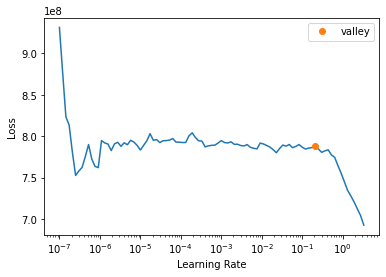

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
    actual  predicted
0   935.00   16725.85
1  1207.00    -426.56
2 28756.00   32319.68
3 13451.00   29588.68
4 27803.00   15779.04
XGBoost RMSE:  10723.827


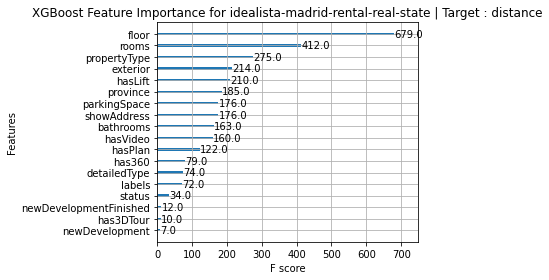

Target Variable: showAddress
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'ex

 12%|█▏        | 5/42 [00:00<00:00, 49.97it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.1644506098259223, 'Adjusted R-Squared': -0.11835072223299625, 'RMSE': 0.39580994259573565, 'Time taken': 0.03102588653564453}
{'Model': 'BaggingRegressor', 'R-Squared': 0.10068011187236392, 'Adjusted R-Squared': -0.2037050810323744, 'RMSE': 0.4106366752056272, 'Time taken': 0.03449392318725586}
{'Model': 'BayesianRidge', 'R-Squared': 0.15604617882518534, 'Adjusted R-Squared': -0.12959972988013657, 'RMSE': 0.3977956026281308, 'Time taken': 0.013615608215332031}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.553030303030303, 'Adjusted R-Squared': -1.0786713286713283, 'RMSE': 0.5396231850265348, 'Time taken': 0.010968923568725586}
{'Model': 'DummyRegressor', 'R-Squared': -0.003074893336312501, 'Adjusted R-Squared': -0.34257716492706436, 'RMSE': 0.43367792484810497, 'Time taken': 0.009626150131225586}
{'Model': 'ElasticNet', 'R-Squared': -0.003074893336312501, 'Adjusted R-Squared': -0.34257716492706436, 'RMSE': 0.43367792484810497, 'Time ta

 24%|██▍       | 10/42 [00:00<00:01, 29.46it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -0.2106928030303028, 'Adjusted R-Squared': -0.6204657517482512, 'RMSE': 0.4764503128010116, 'Time taken': 0.12714171409606934}
{'Model': 'GammaRegressor', 'R-Squared': 0.14658723220804515, 'Adjusted R-Squared': -0.14226016612153947, 'RMSE': 0.40001861701799774, 'Time taken': 0.01246333122253418}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -3.2351926468612424, 'Adjusted R-Squared': -4.668642465798893, 'RMSE': 0.891122113566083, 'Time taken': 0.04579663276672363}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.2483747105170777, 'Adjusted R-Squared': -0.006021541307911216, 'RMSE': 0.37540610247843326, 'Time taken': 0.11744332313537598}


 43%|████▎     | 18/42 [00:01<00:02,  9.86it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.11018489577534618, 'Adjusted R-Squared': -0.19098329334684427, 'RMSE': 0.4084609308638007, 'Time taken': 0.9650185108184814}
{'Model': 'HuberRegressor', 'R-Squared': -0.0954417343018672, 'Adjusted R-Squared': -0.46620662898865284, 'RMSE': 0.4532056102715412, 'Time taken': 0.02975916862487793}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.027878787878787947, 'Adjusted R-Squared': -0.30114685314685286, 'RMSE': 0.42693410179174873, 'Time taken': 0.013321399688720703}
{'Model': 'KernelRidge', 'R-Squared': -7.981334445922975, 'Adjusted R-Squared': -11.021170719927674, 'RMSE': 1.2976903361783034, 'Time taken': 0.05219292640686035}
{'Model': 'Lars', 'R-Squared': 0.15450905847970253, 'Adjusted R-Squared': -0.131657106342552, 'RMSE': 0.39815769681754964, 'Time taken': 0.027079343795776367}
{'Model': 'LarsCV', 'R-Squared': 0.13669477194262092, 'Adjusted R-Squared': -0.1555008437075689, 'RMSE': 0.40233037451919856, 'Time taken': 0.065179

 52%|█████▏    | 22/42 [00:01<00:01, 13.25it/s]

{'Model': 'Lasso', 'R-Squared': -0.003074893336312501, 'Adjusted R-Squared': -0.34257716492706436, 'RMSE': 0.43367792484810497, 'Time taken': 0.013942718505859375}
{'Model': 'LassoCV', 'R-Squared': 0.14395846677255908, 'Adjusted R-Squared': -0.14577866755057478, 'RMSE': 0.4006342315381265, 'Time taken': 0.05341672897338867}
{'Model': 'LassoLars', 'R-Squared': -0.003074893336312501, 'Adjusted R-Squared': -0.34257716492706436, 'RMSE': 0.43367792484810497, 'Time taken': 0.008279561996459961}
{'Model': 'LassoLarsCV', 'R-Squared': 0.13669477194262092, 'Adjusted R-Squared': -0.1555008437075689, 'RMSE': 0.40233037451919856, 'Time taken': 0.02211618423461914}
{'Model': 'LassoLarsIC', 'R-Squared': 0.1470943478953255, 'Adjusted R-Squared': -0.14158141127856427, 'RMSE': 0.3998997496493671, 'Time taken': 0.013570070266723633}
{'Model': 'LinearRegression', 'R-Squared': 0.15450905847970242, 'Adjusted R-Squared': -0.131657106342552, 'RMSE': 0.39815769681754964, 'Time taken': 0.008645296096801758}
{'M

 74%|███████▍  | 31/42 [00:02<00:00, 16.43it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.03145538513860546, 'Adjusted R-Squared': -0.29635971527602023, 'RMSE': 0.4261479969288973, 'Time taken': 0.3796083927154541}
{'Model': 'NuSVR', 'R-Squared': -0.06280375729216447, 'Adjusted R-Squared': -0.42252195206797394, 'RMSE': 0.4464030740175081, 'Time taken': 0.04055476188659668}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.12039608600746643, 'Adjusted R-Squared': -0.17731600795923708, 'RMSE': 0.4061104946607512, 'Time taken': 0.011936664581298828}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.12039608600746643, 'Adjusted R-Squared': -0.17731600795923708, 'RMSE': 0.4061104946607512, 'Time taken': 0.018360376358032227}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -1.7627926079835774, 'Adjusted R-Squared': -2.697891644531865, 'RMSE': 0.7197385733701652, 'Time taken': 0.013313531875610352}
{'Model': 'PoissonRegressor', 'R-Squared': 0.1542609133558106, 'Adjusted R-Squared': -0.13198923904683801, 'RMSE': 0.398216120650

 83%|████████▎ | 35/42 [00:03<00:01,  6.16it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.1255941040777252, 'Adjusted R-Squared': -0.17035866069596772, 'RMSE': 0.40490876192721065, 'Time taken': 0.15416431427001953}
{'Model': 'Ridge', 'R-Squared': 0.1546208907184391, 'Adjusted R-Squared': -0.13150742319224307, 'RMSE': 0.3981313639871803, 'Time taken': 0.00954747200012207}
{'Model': 'RidgeCV', 'R-Squared': 0.15547308014900507, 'Adjusted R-Squared': -0.13036680041594706, 'RMSE': 0.3979306440475043, 'Time taken': 0.009787797927856445}
{'Model': 'SGDRegressor', 'R-Squared': 0.1526443631769424, 'Adjusted R-Squared': -0.13415292928624623, 'RMSE': 0.3985965151683131, 'Time taken': 0.008831977844238281}
{'Model': 'SVR', 'R-Squared': 0.03004230092787974, 'Adjusted R-Squared': -0.29825107414268404, 'RMSE': 0.42645875366326175, 'Time taken': 0.01522064208984375}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.15450905847970242, 'Adjusted R-Squared': -0.131657106342552, 'RMSE': 0.39815769681754964, 'Time taken': 0.009812355041503

100%|██████████| 42/42 [00:04<00:00,  9.85it/s]

{'Model': 'XGBRegressor', 'R-Squared': -0.08777217561603745, 'Adjusted R-Squared': -0.45594121967069623, 'RMSE': 0.45161632, 'Time taken': 0.29862284660339355}
{'Model': 'LGBMRegressor', 'R-Squared': 0.09333863901274009, 'Adjusted R-Squared': -0.2135313600906401, 'RMSE': 0.41230935616974695, 'Time taken': 0.04532504081726074}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: showAddress
showAddress
Target Standard Deviation: 0.4182317632389096
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
GradientBoostingRegressor                   -0.01       0.25  0.38        0.12
AdaBoostRegressor                           -0.12       0.16  0.40        0.03
BayesianRidge                               -0.13       0.16  0.40        0.01
RidgeCV                                     -0.13       0.16  0.40        0.01
Ridge                                    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,6.313980,0.647083,0.804415,00:00
1,5.895440,1.435600,1.198165,00:00


Better model found at epoch 0 with _rmse value: 0.8044145107269287.
No improvement since epoch 0: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       2       1.36
1       1       1.18
2       1       1.02
3       1       0.57
4       1       0.70
XGBoost RMSE:  0.45235533


<Figure size 432x288 with 0 Axes>

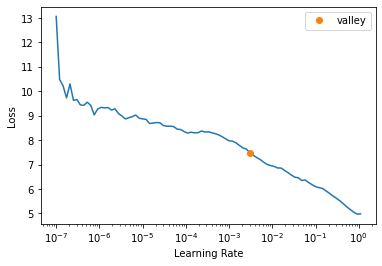

<Figure size 720x720 with 0 Axes>

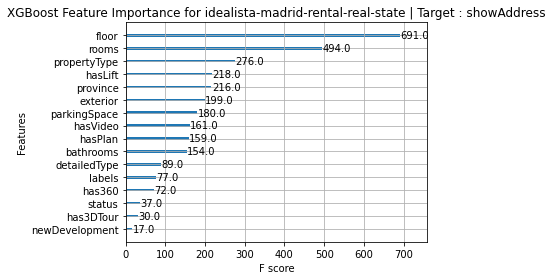

Target Variable: bathrooms
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exte

  5%|▍         | 2/42 [00:00<00:02, 18.60it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -0.45039245073402867, 'Adjusted R-Squared': -0.9412945109824691, 'RMSE': 0.45286332691655434, 'Time taken': 0.08109712600708008}
{'Model': 'BaggingRegressor', 'R-Squared': 0.35651618467782864, 'Adjusted R-Squared': 0.13872166256878604, 'RMSE': 0.30164296533377594, 'Time taken': 0.026253700256347656}
{'Model': 'BayesianRidge', 'R-Squared': 0.24471984929678636, 'Adjusted R-Squared': -0.010913432479685792, 'RMSE': 0.3267972724179572, 'Time taken': 0.012893438339233398}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.09589041095890427, 'Adjusted R-Squared': -0.21011591148577424, 'RMSE': 0.35754847096709713, 'Time taken': 0.009197473526000977}
{'Model': 'DummyRegressor', 'R-Squared': -0.013838142290444999, 'Adjusted R-Squared': -0.356983359681057, 'RMSE': 0.37862448923594255, 'Time taken': 0.007677793502807617}
{'Model': 'ElasticNet', 'R-Squared': -0.013838142290444999, 'Adjusted R-Squared': -0.356983359681057, 'RMSE': 0.37862448923594255, 'Time

 19%|█▉        | 8/42 [00:00<00:00, 40.49it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.2483765401257807, 'Adjusted R-Squared': -0.006019092447032026, 'RMSE': 0.326005217645533, 'Time taken': 0.05687832832336426}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.0333840690005075, 'Adjusted R-Squared': -0.29377824610701286, 'RMSE': 0.36970162689565345, 'Time taken': 0.01104593276977539}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.13031064434297335, 'Adjusted R-Squared': -0.16404575295632795, 'RMSE': 0.3506763396666792, 'Time taken': 0.12333989143371582}
{'Model': 'GammaRegressor', 'R-Squared': 0.22944808444320253, 'Adjusted R-Squared': -0.031354102360636515, 'RMSE': 0.33008465831478745, 'Time taken': 0.012566566467285156}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -3.030265101134371, 'Adjusted R-Squared': -4.394354827672158, 'RMSE': 0.7549030749712171, 'Time taken': 0.024139881134033203}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.33949113561921107, 'Adjusted R-Squared': 0.11593428921340565, 'RMSE': 0.305607292050

 31%|███       | 13/42 [00:00<00:01, 18.28it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.29464658978925096, 'Adjusted R-Squared': 0.055911589410228224, 'RMSE': 0.31581137799266235, 'Time taken': 0.15720272064208984}


 38%|███▊      | 16/42 [00:00<00:01, 20.27it/s]

{'Model': 'HuberRegressor', 'R-Squared': -0.1613043008145787, 'Adjusted R-Squared': -0.5543611410902822, 'RMSE': 0.40522609515710645, 'Time taken': 0.05537009239196777}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.07740639269406402, 'Adjusted R-Squared': -0.23485605900948348, 'RMSE': 0.3611849186421624, 'Time taken': 0.010822057723999023}
{'Model': 'KernelRidge', 'R-Squared': -9.93939416807271, 'Adjusted R-Squared': -13.641958348035779, 'RMSE': 1.243715431744768, 'Time taken': 0.04161381721496582}
{'Model': 'Lars', 'R-Squared': 0.243978423776528, 'Adjusted R-Squared': -0.011905802022185608, 'RMSE': 0.32695763437362024, 'Time taken': 0.03888368606567383}


 45%|████▌     | 19/42 [00:00<00:01, 21.38it/s]

{'Model': 'LarsCV', 'R-Squared': 0.24846081535818432, 'Adjusted R-Squared': -0.005906293289814846, 'RMSE': 0.3259869405845297, 'Time taken': 0.06987357139587402}
{'Model': 'Lasso', 'R-Squared': -0.013838142290444999, 'Adjusted R-Squared': -0.356983359681057, 'RMSE': 0.37862448923594255, 'Time taken': 0.010687112808227539}


 55%|█████▍    | 23/42 [00:00<00:00, 25.19it/s]

{'Model': 'LassoCV', 'R-Squared': 0.24868894745150005, 'Adjusted R-Squared': -0.005600947257222932, 'RMSE': 0.32593745964648124, 'Time taken': 0.06025576591491699}
{'Model': 'LassoLars', 'R-Squared': -0.013838142290444999, 'Adjusted R-Squared': -0.356983359681057, 'RMSE': 0.37862448923594255, 'Time taken': 0.009633779525756836}
{'Model': 'LassoLarsCV', 'R-Squared': 0.24846081535818432, 'Adjusted R-Squared': -0.005906293289814846, 'RMSE': 0.3259869405845297, 'Time taken': 0.025672197341918945}
{'Model': 'LassoLarsIC', 'R-Squared': 0.24762082367474947, 'Adjusted R-Squared': -0.007030589850719915, 'RMSE': 0.32616906671563356, 'Time taken': 0.011798858642578125}
{'Model': 'LinearRegression', 'R-Squared': 0.24397842377652712, 'Adjusted R-Squared': -0.011905802022186718, 'RMSE': 0.32695763437362046, 'Time taken': 0.012340545654296875}
{'Model': 'LinearSVR', 'R-Squared': -0.17501773154778166, 'Adjusted R-Squared': -0.5727160406870306, 'RMSE': 0.40761165889679574, 'Time taken': 0.0207772254943

 71%|███████▏  | 30/42 [00:01<00:00, 19.19it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.3122101828437963, 'Adjusted R-Squared': 0.07941978319092746, 'RMSE': 0.31185467455299287, 'Time taken': 0.3681912422180176}
{'Model': 'NuSVR', 'R-Squared': 0.216351362891258, 'Adjusted R-Squared': -0.04888356043785458, 'RMSE': 0.3328779887230465, 'Time taken': 0.0628499984741211}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.10894979305277552, 'Adjusted R-Squared': -0.19263643083705428, 'RMSE': 0.3549567792859507, 'Time taken': 0.011281490325927734}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.22213867912147067, 'Adjusted R-Squared': -0.04113746025280074, 'RMSE': 0.3316465438642096, 'Time taken': 0.016249656677246094}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.12405938285422513, 'Adjusted R-Squared': -0.5045102508971935, 'RMSE': 0.39867501112047804, 'Time taken': 0.011319875717163086}
{'Model': 'PoissonRegressor', 'R-Squared': 0.23196982266760968, 'Adjusted R-Squared': -0.027978852737199356, 'RMSE': 0.329544091725

 79%|███████▊  | 33/42 [00:02<00:01,  6.03it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.20547945188823968, 'Adjusted R-Squared': -0.6134878817581053, 'RMSE': 0.41286141189386383, 'Time taken': 1.2742884159088135}
{'Model': 'RANSACRegressor', 'R-Squared': 0.11074455323669319, 'Adjusted R-Squared': -0.19023421336011825, 'RMSE': 0.3545991207573242, 'Time taken': 0.12335920333862305}


 83%|████████▎ | 35/42 [00:03<00:01,  6.78it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.3283641159216808, 'Adjusted R-Squared': 0.1010412013105575, 'RMSE': 0.30817069172932343, 'Time taken': 0.1401822566986084}
{'Model': 'Ridge', 'R-Squared': 0.2441759653403881, 'Adjusted R-Squared': -0.011641400236711341, 'RMSE': 0.32691491605443534, 'Time taken': 0.00974416732788086}
{'Model': 'RidgeCV', 'R-Squared': 0.24518149839608838, 'Adjusted R-Squared': -0.010295532916004602, 'RMSE': 0.32669738317372127, 'Time taken': 0.011702537536621094}
{'Model': 'SGDRegressor', 'R-Squared': 0.23471280206291112, 'Adjusted R-Squared': -0.024307480315795882, 'RMSE': 0.3289550906599786, 'Time taken': 0.011802434921264648}
{'Model': 'SVR', 'R-Squared': 0.28505250554407835, 'Adjusted R-Squared': 0.04307027665130492, 'RMSE': 0.3179519271834075, 'Time taken': 0.014645576477050781}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.24397842377652712, 'Adjusted R-Squared': -0.011905802022186718, 'RMSE': 0.32695763437362046, 'Time taken': 0.0095698833

100%|██████████| 42/42 [00:03<00:00, 12.14it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.11195268904501454, 'Adjusted R-Squared': -0.18861717004744194, 'RMSE': 0.35435817, 'Time taken': 0.2958495616912842}
{'Model': 'LGBMRegressor', 'R-Squared': 0.26561361848117915, 'Adjusted R-Squared': 0.01705207396711672, 'RMSE': 0.32224537640443784, 'Time taken': 0.04390120506286621}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: bathrooms
bathrooms
Target Standard Deviation: 0.4499956554065509
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
BaggingRegressor                             0.14       0.36  0.30        0.03
GradientBoostingRegressor                    0.12       0.34  0.31        0.11
RandomForestRegressor                        0.10       0.33  0.31        0.14
MLPRegressor                                 0.08       0.31  0.31        0.37
HistGradientBoostingRegressor                0.

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,14.449239,0.405162,0.636523,00:00
1,11.619765,0.211706,0.460115,00:00
2,9.013121,0.462684,0.680209,00:00


Better model found at epoch 0 with _rmse value: 0.6365231871604919.
Better model found at epoch 1 with _rmse value: 0.46011513471603394.
No improvement since epoch 1: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.01
1       1       0.93
2       1       1.00
3       2       0.98
4       1       1.86
XGBoost RMSE:  0.3619162


<Figure size 432x288 with 0 Axes>

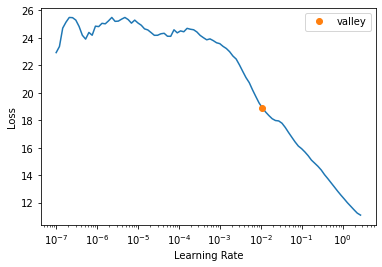

<Figure size 720x720 with 0 Axes>

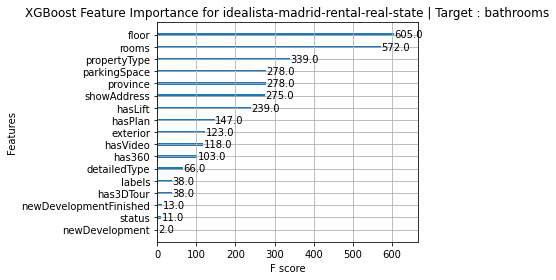

Target Variable: rooms
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior

 17%|█▋        | 7/42 [00:00<00:00, 47.34it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.3588213246217443, 'Adjusted R-Squared': 0.14180700372448862, 'RMSE': 0.684565610615756, 'Time taken': 0.03275322914123535}
{'Model': 'BaggingRegressor', 'R-Squared': 0.358333660482242, 'Adjusted R-Squared': 0.1411542840300778, 'RMSE': 0.6848258927018533, 'Time taken': 0.026553869247436523}
{'Model': 'BayesianRidge', 'R-Squared': 0.3959878311672238, 'Adjusted R-Squared': 0.19155294325459193, 'RMSE': 0.6644287062050582, 'Time taken': 0.00919961929321289}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.08559010066531514, 'Adjusted R-Squared': -0.2239024806479628, 'RMSE': 0.8175155139044595, 'Time taken': 0.009198904037475586}
{'Model': 'DummyRegressor', 'R-Squared': -0.02170876124098209, 'Adjusted R-Squared': -0.3675178804302375, 'RMSE': 0.8641499361611675, 'Time taken': 0.007746458053588867}
{'Model': 'ElasticNet', 'R-Squared': 0.0337788150896845, 'Adjusted R-Squared': -0.2932498936491914, 'RMSE': 0.8403569983240938, 'Time taken': 0.0081546

 29%|██▊       | 12/42 [00:00<00:01, 24.47it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.18303965855521664, 'Adjusted R-Squared': -0.09346999547224843, 'RMSE': 0.772726899446557, 'Time taken': 0.12854886054992676}
{'Model': 'GammaRegressor', 'R-Squared': 0.3071350018977971, 'Adjusted R-Squared': 0.07262684869397462, 'RMSE': 0.7116228007119273, 'Time taken': 0.011037588119506836}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -2.6396492805066205, 'Adjusted R-Squared': -3.8715305754473226, 'RMSE': 1.6310050727933745, 'Time taken': 0.030733108520507812}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.3586352025329972, 'Adjusted R-Squared': 0.14155788646724243, 'RMSE': 0.6846649616556332, 'Time taken': 0.11961174011230469}


 48%|████▊     | 20/42 [00:00<00:00, 24.91it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.47155432875994985, 'Adjusted R-Squared': 0.29269579387870215, 'RMSE': 0.6214779375504144, 'Time taken': 0.16167426109313965}
{'Model': 'HuberRegressor', 'R-Squared': 0.3890780705851635, 'Adjusted R-Squared': 0.18230449447552666, 'RMSE': 0.6682183547996212, 'Time taken': 0.016161680221557617}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.3861766784452295, 'Adjusted R-Squared': 0.17842109268823036, 'RMSE': 0.669803227549975, 'Time taken': 0.009557962417602539}
{'Model': 'KernelRidge', 'R-Squared': -9.835298396063376, 'Adjusted R-Squared': -13.502630160884825, 'RMSE': 2.814141828443236, 'Time taken': 0.01616358757019043}
{'Model': 'Lars', 'R-Squared': 0.38758499041504124, 'Adjusted R-Squared': 0.1803060640939783, 'RMSE': 0.6690344122032491, 'Time taken': 0.016223907470703125}
{'Model': 'LarsCV', 'R-Squared': 0.393343010267466, 'Adjusted R-Squared': 0.18801295220414682, 'RMSE': 0.6658818022920637, 'Time taken': 0.03247523307800293

 62%|██████▏   | 26/42 [00:01<00:00, 17.61it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.24626282439692826, 'Adjusted R-Squared': -0.008848219653342149, 'RMSE': 0.7422248855449987, 'Time taken': 0.392103910446167}
{'Model': 'NuSVR', 'R-Squared': 0.3477966352353672, 'Adjusted R-Squared': 0.12705088100733763, 'RMSE': 0.6904258781012169, 'Time taken': 0.02651190757751465}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.2270346427274368, 'Adjusted R-Squared': -0.034584401272507614, 'RMSE': 0.7516325140849672, 'Time taken': 0.010826349258422852}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.3396697092658548, 'Adjusted R-Squared': 0.1161733031712211, 'RMSE': 0.6947141637482315, 'Time taken': 0.016901254653930664}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.5732346723002293, 'Adjusted R-Squared': -1.105714099847999, 'RMSE': 1.0723147948569118, 'Time taken': 0.012620687484741211}
{'Model': 'PoissonRegressor', 'R-Squared': 0.3810122748157553, 'Adjusted R-Squared': 0.17150873706108793, 'RMSE': 0.6726150210155257, '

 76%|███████▌  | 32/42 [00:02<00:01,  9.08it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.05724381624948549, 'Adjusted R-Squared': -0.41508018482623443, 'RMSE': 0.8790490729894824, 'Time taken': 1.1108026504516602}
{'Model': 'RANSACRegressor', 'R-Squared': 0.3458540776633816, 'Adjusted R-Squared': 0.1244508424109878, 'RMSE': 0.6914533144076525, 'Time taken': 0.12427473068237305}


 81%|████████  | 34/42 [00:02<00:00,  8.66it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.3121347235551166, 'Adjusted R-Squared': 0.07931878383530999, 'RMSE': 0.7090506129901953, 'Time taken': 0.15564513206481934}
{'Model': 'Ridge', 'R-Squared': 0.3884333803036629, 'Adjusted R-Squared': 0.18144160132951814, 'RMSE': 0.6685708386989629, 'Time taken': 0.00962066650390625}
{'Model': 'RidgeCV', 'R-Squared': 0.39471299364892265, 'Adjusted R-Squared': 0.18984662226855809, 'RMSE': 0.6651295134192045, 'Time taken': 0.008878231048583984}
{'Model': 'SGDRegressor', 'R-Squared': 0.3915003267384679, 'Adjusted R-Squared': 0.1855465911730263, 'RMSE': 0.6668923231637671, 'Time taken': 0.011779546737670898}
{'Model': 'SVR', 'R-Squared': 0.35325204873884186, 'Adjusted R-Squared': 0.1343527421581422, 'RMSE': 0.6875322498200602, 'Time taken': 0.017238140106201172}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.38758499041504124, 'Adjusted R-Squared': 0.1803060640939783, 'RMSE': 0.6690344122032491, 'Time taken': 0.009291410446166992}
{'Mo

100%|██████████| 42/42 [00:03<00:00, 13.31it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.11945673035471682, 'Adjusted R-Squared': -0.1785732993713789, 'RMSE': 0.8022337, 'Time taken': 0.2841908931732178}
{'Model': 'LGBMRegressor', 'R-Squared': 0.4599853496404591, 'Adjusted R-Squared': 0.2772111602879992, 'RMSE': 0.6282439493098169, 'Time taken': 0.045751333236694336}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: rooms
rooms
Target Standard Deviation: 0.9891080677571046
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
HistGradientBoostingRegressor                0.29       0.47  0.62        0.16
LGBMRegressor                                0.28       0.46  0.63        0.05
BayesianRidge                                0.19       0.40  0.66        0.01
RidgeCV                                      0.19       0.39  0.67        0.01
ElasticNetCV                                 0.19       0.3

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,10.682123,4.751688,2.179837,00:00
1,8.804956,2.605598,1.614186,00:00
2,6.767528,2.307938,1.519190,00:00
3,5.706699,1.537530,1.239972,00:00
4,4.990791,1.669701,1.292169,00:00


Better model found at epoch 0 with _rmse value: 2.1798367500305176.
Better model found at epoch 1 with _rmse value: 1.614186406135559.
Better model found at epoch 2 with _rmse value: 1.5191898345947266.
Better model found at epoch 3 with _rmse value: 1.2399719953536987.
No improvement since epoch 3: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       3       2.73
1       3       3.48
2       4       3.37
3       4       3.48
4       2       3.04
XGBoost RMSE:  0.79923093


<Figure size 432x288 with 0 Axes>

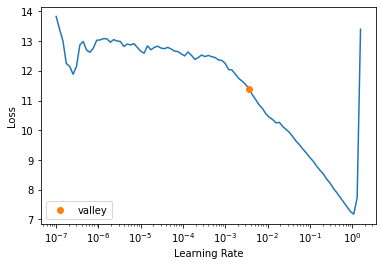

<Figure size 720x720 with 0 Axes>

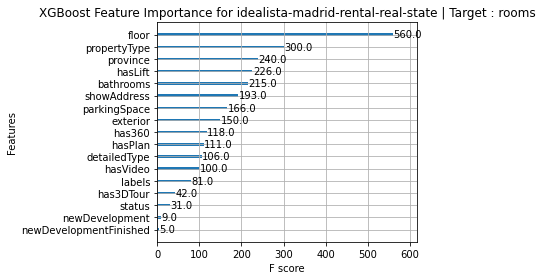

Target Variable: exterior
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
32
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exter

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -0.024272895209358936, 'Adjusted R-Squared': -0.3709498751263727, 'RMSE': 0.4313921288666319, 'Time taken': 0.017024993896484375}
{'Model': 'BaggingRegressor', 'R-Squared': -0.03725153260440761, 'Adjusted R-Squared': -0.388321282101284, 'RMSE': 0.4341166261977564, 'Time taken': 0.027359962463378906}
{'Model': 'BayesianRidge', 'R-Squared': -0.013818577199481652, 'Adjusted R-Squared': -0.35695717255930615, 'RMSE': 0.42918496449059373, 'Time taken': 0.011698246002197266}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.2312216694306246, 'Adjusted R-Squared': -0.6479428498532975, 'RMSE': 0.47296880970048644, 'Time taken': 0.010033130645751953}


 17%|█▋        | 7/42 [00:00<00:00, 47.94it/s]

{'Model': 'DummyRegressor', 'R-Squared': -0.022189726687919187, 'Adjusted R-Squared': -0.36816163418229175, 'RMSE': 0.43095322244913686, 'Time taken': 0.010733604431152344}
{'Model': 'ElasticNet', 'R-Squared': -0.022189726687919187, 'Adjusted R-Squared': -0.36816163418229175, 'RMSE': 0.43095322244913686, 'Time taken': 0.010163307189941406}
{'Model': 'ElasticNetCV', 'R-Squared': -0.050676338186463665, 'Adjusted R-Squared': -0.40628986803418976, 'RMSE': 0.4369169089293908, 'Time taken': 0.05793952941894531}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -0.35631051093737653, 'Adjusted R-Squared': -0.8153694531007962, 'RMSE': 0.49641390761819687, 'Time taken': 0.012465715408325195}


 29%|██▊       | 12/42 [00:00<00:01, 27.68it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -0.03198919687277857, 'Adjusted R-Squared': -0.3812778481220267, 'RMSE': 0.4330140140499339, 'Time taken': 0.12922191619873047}
{'Model': 'GammaRegressor', 'R-Squared': 0.002437572134643462, 'Adjusted R-Squared': -0.33519894191209243, 'RMSE': 0.42573016033907474, 'Time taken': 0.011320829391479492}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -4.234645534789031, 'Adjusted R-Squared': -6.006371715794549, 'RMSE': 0.9752321631998632, 'Time taken': 0.04092144966125488}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.10695730520157787, 'Adjusted R-Squared': -0.19530329919173406, 'RMSE': 0.4028102263576973, 'Time taken': 0.0602107048034668}


 48%|████▊     | 20/42 [00:00<00:00, 23.14it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': -0.0031365024520471074, 'Adjusted R-Squared': -0.3426596263588937, 'RMSE': 0.4269179285721272, 'Time taken': 0.2124927043914795}
{'Model': 'HuberRegressor', 'R-Squared': -0.20123103178147717, 'Adjusted R-Squared': -0.6078015348459771, 'RMSE': 0.4671729064260041, 'Time taken': 0.045088768005371094}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.019303482587064713, 'Adjusted R-Squared': -0.3126245694603902, 'RMSE': 0.4221158824088691, 'Time taken': 0.009533405303955078}
{'Model': 'KernelRidge', 'R-Squared': -16.910235642249397, 'Adjusted R-Squared': -22.972161551933805, 'RMSE': 1.8039106662236657, 'Time taken': 0.012485265731811523}
{'Model': 'Lars', 'R-Squared': -0.0516066995051756, 'Adjusted R-Squared': -0.40753512087615795, 'RMSE': 0.43711030847165183, 'Time taken': 0.014673471450805664}
{'Model': 'LarsCV', 'R-Squared': -0.033837918506954834, 'Adjusted R-Squared': -0.3837522909246933, 'RMSE': 0.4334016945517176, 'Time taken': 0.

 69%|██████▉   | 29/42 [00:01<00:00, 17.94it/s]

{'Model': 'MLPRegressor', 'R-Squared': -0.13845215610246608, 'Adjusted R-Squared': -0.5237744243217621, 'RMSE': 0.4548013744947062, 'Time taken': 0.43546271324157715}
{'Model': 'NuSVR', 'R-Squared': -0.06692065260543356, 'Adjusted R-Squared': -0.4280322581026572, 'RMSE': 0.4402815001296159, 'Time taken': 0.0745694637298584}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.006883938007475998, 'Adjusted R-Squared': -0.3292476522053782, 'RMSE': 0.4247803119646487, 'Time taken': 0.014649391174316406}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -0.01785165045696302, 'Adjusted R-Squared': -0.36235528599624267, 'RMSE': 0.4300377878650408, 'Time taken': 0.017518043518066406}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.8307527543848972, 'Adjusted R-Squared': -1.4503921481767081, 'RMSE': 0.5767388732975833, 'Time taken': 0.01155543327331543}
{'Model': 'PoissonRegressor', 'R-Squared': -0.0068827137839040375, 'Adjusted R-Squared': -0.3476737861415331, 'RMSE': 0.427714347

 76%|███████▌  | 32/42 [00:02<00:01,  7.71it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.3134328356058096, 'Adjusted R-Squared': -0.7579793338108527, 'RMSE': 0.48850421041919884, 'Time taken': 1.0338878631591797}
{'Model': 'RANSACRegressor', 'R-Squared': -0.3134328358208953, 'Adjusted R-Squared': -0.7579793340987366, 'RMSE': 0.48850421045919723, 'Time taken': 0.1316051483154297}


 81%|████████  | 34/42 [00:02<00:01,  7.57it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.07721153575292028, 'Adjusted R-Squared': -0.2351168675307067, 'RMSE': 0.4094637456951388, 'Time taken': 0.1516587734222412}
{'Model': 'Ridge', 'R-Squared': -0.05048724745162314, 'Adjusted R-Squared': -0.4060367773583262, 'RMSE': 0.43687759108532304, 'Time taken': 0.01407480239868164}
{'Model': 'RidgeCV', 'R-Squared': -0.04254698757186204, 'Adjusted R-Squared': -0.39540904490387674, 'RMSE': 0.4352233579686285, 'Time taken': 0.009874582290649414}
{'Model': 'SGDRegressor', 'R-Squared': -0.03966919142047631, 'Adjusted R-Squared': -0.3915572254397144, 'RMSE': 0.4346222581435966, 'Time taken': 0.009079217910766602}
{'Model': 'SVR', 'R-Squared': 0.030878701964305644, 'Adjusted R-Squared': -0.2971315835246986, 'RMSE': 0.41961735852370174, 'Time taken': 0.013629436492919922}
{'Model': 'TransformedTargetRegressor', 'R-Squared': -0.05160669950517782, 'Adjusted R-Squared': -0.40753512087616106, 'RMSE': 0.4371103084716523, 'Time taken': 0.0089151859

100%|██████████| 42/42 [00:03<00:00, 13.07it/s]

{'Model': 'XGBRegressor', 'R-Squared': -0.0354411994229773, 'Adjusted R-Squared': -0.3858982207661388, 'RMSE': 0.43373764, 'Time taken': 0.31059694290161133}
{'Model': 'LGBMRegressor', 'R-Squared': 0.008792056624693734, 'Adjusted R-Squared': -0.3266937088254098, 'RMSE': 0.42437204099083053, 'Time taken': 0.04595756530761719}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: exterior
exterior
Target Standard Deviation: 0.3800878687356873
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
GradientBoostingRegressor                   -0.20       0.11  0.40        0.06
RandomForestRegressor                       -0.24       0.08  0.41        0.15
SVR                                         -0.30       0.03  0.42        0.01
KNeighborsRegressor                         -0.31       0.02  0.42        0.01
LGBMRegressor                               -0.3

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,5.448775,2.171397,1.473566,00:00
1,4.839490,1.165841,1.079741,00:00
2,4.629978,0.851577,0.922809,00:00
3,3.921231,1.252143,1.118992,00:00


Better model found at epoch 0 with _rmse value: 1.473565936088562.
Better model found at epoch 1 with _rmse value: 1.0797410011291504.
Better model found at epoch 2 with _rmse value: 0.9228091239929199.
No improvement since epoch 2: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       2       1.87
1       1       2.02
2       2       1.95
3       1       0.96
4       2       2.00
XGBoost RMSE:  0.43372068


<Figure size 432x288 with 0 Axes>

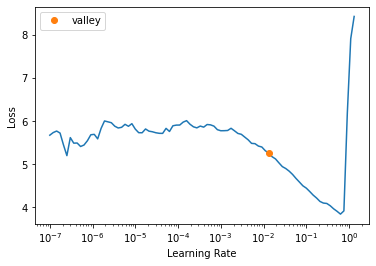

<Figure size 720x720 with 0 Axes>

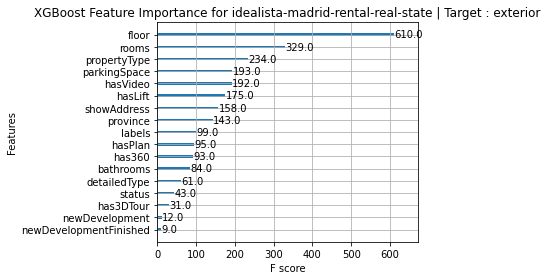

Target Variable: size
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'price', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
31
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'price', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior', 'rooms', 'bath

 10%|▉         | 4/42 [00:00<00:00, 38.86it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.5762503291218621, 'Adjusted R-Squared': 0.42396529115003134, 'RMSE': 26.139249586838964, 'Time taken': 0.053939104080200195}
{'Model': 'BaggingRegressor', 'R-Squared': 0.5115786438225426, 'Adjusted R-Squared': 0.3360522189462688, 'RMSE': 28.063106938428394, 'Time taken': 0.030710697174072266}
{'Model': 'BayesianRidge', 'R-Squared': 0.4449555632753326, 'Adjusted R-Squared': 0.2454864688274052, 'RMSE': 29.91591603612924, 'Time taken': 0.009357452392578125}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.8087474065616362, 'Adjusted R-Squared': 0.7400160057947243, 'RMSE': 17.560710977467362, 'Time taken': 0.008677482604980469}
{'Model': 'DummyRegressor', 'R-Squared': -0.0003322692314597919, 'Adjusted R-Squared': -0.3598266784865156, 'RMSE': 40.16156, 'Time taken': 0.011251211166381836}
{'Model': 'ElasticNet', 'R-Squared': 0.46121445922750104, 'Adjusted R-Squared': 0.2675884055123843, 'RMSE': 29.47449648253599, 'Time taken': 0.0117609500885009

 21%|██▏       | 9/42 [00:00<00:01, 24.02it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.4141664299924992, 'Adjusted R-Squared': 0.2036324907710536, 'RMSE': 30.73445779212537, 'Time taken': 0.15488910675048828}
{'Model': 'GammaRegressor', 'R-Squared': 0.37469491583461956, 'Adjusted R-Squared': 0.149975901212686, 'RMSE': 31.75297405470697, 'Time taken': 0.015320539474487305}


 29%|██▊       | 12/42 [00:00<00:01, 24.17it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -0.9691837634717497, 'Adjusted R-Squared': -1.6768591784694098, 'RMSE': 56.348395182405866, 'Time taken': 0.04198002815246582}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.76503701654035, 'Adjusted R-Squared': 0.6805971943595381, 'RMSE': 19.464271448900362, 'Time taken': 0.0635371208190918}


 36%|███▌      | 15/42 [00:00<00:01, 18.82it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.4365403966147421, 'Adjusted R-Squared': 0.234047101648165, 'RMSE': 30.141844238425854, 'Time taken': 0.20187783241271973}
{'Model': 'HuberRegressor', 'R-Squared': 0.3695186938679591, 'Adjusted R-Squared': 0.14293947447675692, 'RMSE': 31.884127395795826, 'Time taken': 0.016414642333984375}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.5872179826879999, 'Adjusted R-Squared': 0.43887444521649976, 'RMSE': 25.798758, 'Time taken': 0.009354829788208008}
{'Model': 'KernelRidge', 'R-Squared': -2.4588302041371852, 'Adjusted R-Squared': -3.7018473087489863, 'RMSE': 74.67978346115764, 'Time taken': 0.021961212158203125}
{'Model': 'Lars', 'R-Squared': 0.41936427168745694, 'Adjusted R-Squared': 0.2106983068251368, 'RMSE': 30.597807394110372, 'Time taken': 0.01759052276611328}
{'Model': 'LarsCV', 'R-Squared': 0.4320732233042933, 'Adjusted R-Squared': 0.2279745379292737, 'RMSE': 30.261092376256908, 'Time taken': 0.03617095947265625}
{'Model'

 48%|████▊     | 20/42 [00:00<00:00, 22.10it/s]

{'Model': 'LassoCV', 'R-Squared': 0.4301950405696814, 'Adjusted R-Squared': 0.22542138327441064, 'RMSE': 30.311089093114397, 'Time taken': 0.0852973461151123}
{'Model': 'LassoLars', 'R-Squared': 0.014165564739360814, 'Adjusted R-Squared': -0.3401186854324314, 'RMSE': 39.86946616002234, 'Time taken': 0.00971364974975586}
{'Model': 'LassoLarsCV', 'R-Squared': 0.4320732233042933, 'Adjusted R-Squared': 0.2279745379292737, 'RMSE': 30.261092376256908, 'Time taken': 0.026633024215698242}
{'Model': 'LassoLarsIC', 'R-Squared': 0.43186802374563127, 'Adjusted R-Squared': 0.22769559477921752, 'RMSE': 30.266558751727086, 'Time taken': 0.011545658111572266}
{'Model': 'LinearRegression', 'R-Squared': 0.41936427168745727, 'Adjusted R-Squared': 0.21069830682513724, 'RMSE': 30.597807394110365, 'Time taken': 0.008048295974731445}
{'Model': 'LinearSVR', 'R-Squared': 0.3143779755307353, 'Adjusted R-Squared': 0.06798256048709328, 'RMSE': 33.2491700166446, 'Time taken': 0.008838415145874023}


 62%|██████▏   | 26/42 [00:01<00:00, 16.81it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.3785052562881107, 'Adjusted R-Squared': 0.15515558276665053, 'RMSE': 31.656081735211327, 'Time taken': 0.3993997573852539}
{'Model': 'NuSVR', 'R-Squared': 0.10770383579884346, 'Adjusted R-Squared': -0.21296509821094722, 'RMSE': 37.93088202212023, 'Time taken': 0.021338462829589844}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.2824977482270282, 'Adjusted R-Squared': 0.024645376496116533, 'RMSE': 34.01340128197032, 'Time taken': 0.011600017547607422}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.3952683338081199, 'Adjusted R-Squared': 0.17794289127041296, 'RMSE': 31.226246515877175, 'Time taken': 0.017653226852416992}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.45456758540523956, 'Adjusted R-Squared': 0.25855281141024755, 'RMSE': 29.655749234066256, 'Time taken': 0.011649608612060547}
{'Model': 'PoissonRegressor', 'R-Squared': 0.2684362393910803, 'Adjusted R-Squared': 0.0055305129222498195, 'RMSE': 34.3450790649552, '

 76%|███████▌  | 32/42 [00:03<00:01,  6.61it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.03530975896393129, 'Adjusted R-Squared': -0.40737420359159415, 'RMSE': 40.857668692923866, 'Time taken': 1.7148113250732422}
{'Model': 'RANSACRegressor', 'R-Squared': 0.3689511638196039, 'Adjusted R-Squared': 0.14216798831727406, 'RMSE': 31.898474474688825, 'Time taken': 0.12341451644897461}


 81%|████████  | 34/42 [00:03<00:01,  6.69it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.5253483485846884, 'Adjusted R-Squared': 0.3547704113573108, 'RMSE': 27.66469756067335, 'Time taken': 0.15358686447143555}
{'Model': 'Ridge', 'R-Squared': 0.4212168037339401, 'Adjusted R-Squared': 0.21321659257582481, 'RMSE': 30.54895688362594, 'Time taken': 0.009830474853515625}
{'Model': 'RidgeCV', 'R-Squared': 0.43503978381881137, 'Adjusted R-Squared': 0.23200720612869674, 'RMSE': 30.181954622398905, 'Time taken': 0.008976459503173828}
{'Model': 'SGDRegressor', 'R-Squared': 0.43233701782230316, 'Adjusted R-Squared': 0.22833313360219332, 'RMSE': 30.254063620273943, 'Time taken': 0.00951838493347168}
{'Model': 'SVR', 'R-Squared': 0.10635372040154156, 'Adjusted R-Squared': -0.2148004113291544, 'RMSE': 37.9595674031278, 'Time taken': 0.017539024353027344}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.41936427168745727, 'Adjusted R-Squared': 0.21069830682513724, 'RMSE': 30.597807394110365, 'Time taken': 0.01180577278137207}
{'Mode

100%|██████████| 42/42 [00:03<00:00, 10.96it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.3473027284087169, 'Adjusted R-Squared': 0.11273964643059953, 'RMSE': 32.441006, 'Time taken': 0.2992055416107178}
{'Model': 'LGBMRegressor', 'R-Squared': 0.4386419480800615, 'Adjusted R-Squared': 0.23690389817133362, 'RMSE': 30.085581276956628, 'Time taken': 0.03160214424133301}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: size
size
Target Standard Deviation: 34.6660270690918
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        0.74       0.81 17.56        0.01
GradientBoostingRegressor                    0.68       0.77 19.46        0.06
ExtraTreeRegressor                           0.60       0.70 21.83        0.01
KNeighborsRegressor                          0.44       0.59 25.80        0.01
AdaBoostRegressor                            0.42       0.58 26.

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,6358.206055,6197.279785,78.722801,00:00
1,5847.462402,5540.953613,74.437584,00:00
2,5082.685059,2799.396484,52.909325,00:00
3,4089.675293,2059.438477,45.381039,00:00
4,3389.990234,2008.076904,44.811573,00:00
5,2904.360107,2273.682617,47.683147,00:00


Better model found at epoch 0 with _rmse value: 78.7228012084961.
Better model found at epoch 1 with _rmse value: 74.43758392333984.
Better model found at epoch 2 with _rmse value: 52.909324645996094.
Better model found at epoch 3 with _rmse value: 45.381038665771484.
Better model found at epoch 4 with _rmse value: 44.81157302856445.
No improvement since epoch 4: early stopping


,propertyType,operation,exterior,rooms,bathrooms,province,country,showAddress,hasVideo,status,newDevelopment,detailedType,hasPlan,has3DTour,has360,hasStaging,superTopHighlight,topNewDevelopment,floor,hasLift,parkingSpace,labels,newDevelopmentFinished,size,size_pred
0,4.00,1.00,2.00,2.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,11.00,2.00,1.00,1.00,1.00,35.00,44.36
1,4.00,1.00,2.00,3.00,2.00,2.00,1.00,2.00,1.00,2.00,2.00,10.00,2.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,6.00,1.00,2.00,79.00,43.51
2,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,4.00,1.00,6.00,1.00,1.00,80.00,46.01
3,4.00,1.00,2.00,3.00,1.00,4.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,4.00,2.00,6.00,1.00,1.00,76.00,61.98
4,4.00,1.00,2.00,4.00,2.00,4.00,1.00,1.00,2.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,4.00,2.00,6.00,1.00,1.00,115.00,38.66
5,4.00,1.00,2.00,2.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,2.00,1.00,2.00,1.00,1.00,1.00,2.00,2.00,1.00,1.00,1.00,57.00,43.43
6,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,2.00,1.00,1.00,1.00,66.00,43.40
7,4.00,1.00,1.00,3.00,1.00,2.00,1.00,2.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,7.00,2.00,6.00,1.00,1.00,80.00,46.87
8,4.00,1.00,2.00,4.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,2.00,1.00,1.00,1.00,65.00,49.17


<Figure size 432x288 with 0 Axes>

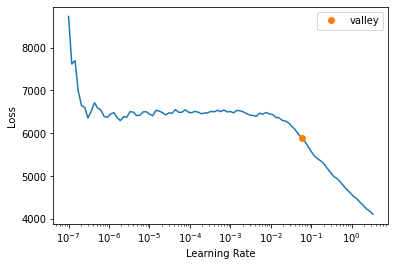

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0   80.00      78.45
1   36.00      68.72
2   64.00      62.13
3   60.00      71.92
4   75.00      82.88
XGBoost RMSE:  32.442947


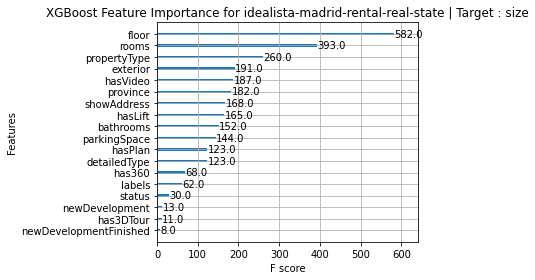

Target Variable: price
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'numPhotos', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
31
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['numPhotos', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior', 'rooms', 'bathr

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.2894804496523835, 'Adjusted R-Squared': 0.034137486246208826, 'RMSE': 70.45700744576197, 'Time taken': 0.04459738731384277}


 14%|█▍        | 6/42 [00:00<00:00, 55.49it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.3156856613315724, 'Adjusted R-Squared': 0.06976019587260618, 'RMSE': 69.14551205073342, 'Time taken': 0.027738332748413086}
{'Model': 'BayesianRidge', 'R-Squared': 0.20349498677807, 'Adjusted R-Squared': -0.08274900234856108, 'RMSE': 74.59855822588091, 'Time taken': 0.009943723678588867}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.18876693928081112, 'Adjusted R-Squared': -0.6159800580848527, 'RMSE': 91.13486116742509, 'Time taken': 0.008798599243164062}
{'Model': 'DummyRegressor', 'R-Squared': -0.001409623695921347, 'Adjusted R-Squared': -0.361291207211643, 'RMSE': 83.6454, 'Time taken': 0.007747650146484375}
{'Model': 'ElasticNet', 'R-Squared': 0.1957147911595143, 'Adjusted R-Squared': -0.09332520576753534, 'RMSE': 74.96200914112647, 'Time taken': 0.008649587631225586}
{'Model': 'ElasticNetCV', 'R-Squared': 0.20437169311877823, 'Adjusted R-Squared': -0.0815572296666609, 'RMSE': 74.55749192094899, 'Time taken': 0.057749032974243164}
{

 29%|██▊       | 12/42 [00:00<00:01, 22.66it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.11352162120115383, 'Adjusted R-Squared': -0.2050565461796816, 'RMSE': 78.69918790527821, 'Time taken': 0.14554715156555176}
{'Model': 'GammaRegressor', 'R-Squared': 0.17212644412460754, 'Adjusted R-Squared': -0.12539061501811166, 'RMSE': 76.05332087970825, 'Time taken': 0.01125955581665039}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -17.441821631074376, 'Adjusted R-Squared': -24.06935127974173, 'RMSE': 358.953411891807, 'Time taken': 0.030847787857055664}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.4133717241814946, 'Adjusted R-Squared': 0.20255218755921922, 'RMSE': 64.02029533722443, 'Time taken': 0.11842584609985352}


 45%|████▌     | 19/42 [00:00<00:01, 22.74it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.42830311627964857, 'Adjusted R-Squared': 0.22284954869264728, 'RMSE': 63.200292687438534, 'Time taken': 0.13904595375061035}
{'Model': 'HuberRegressor', 'R-Squared': 0.13398116759546408, 'Adjusted R-Squared': -0.17724435029991592, 'RMSE': 77.78571449208638, 'Time taken': 0.015862464904785156}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.2650377033690495, 'Adjusted R-Squared': 0.0009106280173016845, 'RMSE': 71.65866, 'Time taken': 0.00935220718383789}
{'Model': 'KernelRidge', 'R-Squared': -67.34644732458665, 'Adjusted R-Squared': -91.90845183185998, 'RMSE': 691.0256202540414, 'Time taken': 0.02920222282409668}
{'Model': 'Lars', 'R-Squared': 0.18241542245093723, 'Adjusted R-Squared': -0.11140403510575725, 'RMSE': 75.57924033196294, 'Time taken': 0.032498836517333984}
{'Model': 'LarsCV', 'R-Squared': 0.2656627951327507, 'Adjusted R-Squared': 0.0017603621335829933, 'RMSE': 71.62818442573541, 'Time taken': 0.06386995315551758}
{'M

 55%|█████▍    | 23/42 [00:00<00:00, 26.13it/s]

{'Model': 'LassoCV', 'R-Squared': 0.2637524526277788, 'Adjusted R-Squared': -0.0008365097091131979, 'RMSE': 71.72129252916302, 'Time taken': 0.055579423904418945}
{'Model': 'LassoLars', 'R-Squared': 0.23684171890802275, 'Adjusted R-Squared': -0.037418288359406526, 'RMSE': 73.0202789455344, 'Time taken': 0.011113643646240234}
{'Model': 'LassoLarsCV', 'R-Squared': 0.2656627951327507, 'Adjusted R-Squared': 0.0017603621335829933, 'RMSE': 71.62818442573541, 'Time taken': 0.027014970779418945}
{'Model': 'LassoLarsIC', 'R-Squared': 0.2615656778880111, 'Adjusted R-Squared': -0.0038091566209847993, 'RMSE': 71.82772549806383, 'Time taken': 0.014253616333007812}
{'Model': 'LinearRegression', 'R-Squared': 0.18241542245093734, 'Adjusted R-Squared': -0.11140403510575703, 'RMSE': 75.57924033196292, 'Time taken': 0.014126777648925781}
{'Model': 'LinearSVR', 'R-Squared': -14.863400384682643, 'Adjusted R-Squared': -20.56430989792797, 'RMSE': 332.91573327230566, 'Time taken': 0.01037740707397461}


 62%|██████▏   | 26/42 [00:01<00:01, 14.82it/s]

{'Model': 'MLPRegressor', 'R-Squared': -51.3063741004008, 'Adjusted R-Squared': -70.10397729273234, 'RMSE': 604.5239131122279, 'Time taken': 0.4122798442840576}
{'Model': 'NuSVR', 'R-Squared': 0.021038353585627778, 'Adjusted R-Squared': -0.33077598809453734, 'RMSE': 82.70257195235774, 'Time taken': 0.01981067657470703}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.23521226520453087, 'Adjusted R-Squared': -0.03963332698759081, 'RMSE': 73.09819182614885, 'Time taken': 0.011351346969604492}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.2597462043059582, 'Adjusted R-Squared': -0.006282503521588101, 'RMSE': 71.91616142335492, 'Time taken': 0.017504453659057617}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.098736563954827, 'Adjusted R-Squared': -0.22515498337390705, 'RMSE': 79.35276301377168, 'Time taken': 0.011885881423950195}
{'Model': 'PoissonRegressor', 'R-Squared': 0.18630499814983004, 'Adjusted R-Squared': -0.10611664314007485, 'RMSE': 75.39924571532741, 'Ti

 76%|███████▌  | 32/42 [00:03<00:01,  5.75it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.0860726328041661, 'Adjusted R-Squared': -0.4763799852181634, 'RMSE': 87.109518318791, 'Time taken': 1.7949354648590088}
{'Model': 'RANSACRegressor', 'R-Squared': -0.5258985680384702, 'Adjusted R-Squared': -1.0742683659272956, 'RMSE': 103.2521276930029, 'Time taken': 0.12772059440612793}


 81%|████████  | 34/42 [00:03<00:01,  5.92it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.32599961972026503, 'Adjusted R-Squared': 0.08378073305723532, 'RMSE': 68.62245449397183, 'Time taken': 0.1584014892578125}
{'Model': 'Ridge', 'R-Squared': 0.18334055563168816, 'Adjusted R-Squared': -0.11014643218817399, 'RMSE': 75.53646759886286, 'Time taken': 0.010967493057250977}
{'Model': 'RidgeCV', 'R-Squared': 0.19022507470498606, 'Adjusted R-Squared': -0.10078778907290964, 'RMSE': 75.21740383225605, 'Time taken': 0.008582353591918945}
{'Model': 'SGDRegressor', 'R-Squared': 0.17907375810287207, 'Adjusted R-Squared': -0.11594661007890839, 'RMSE': 75.73353807500834, 'Time taken': 0.010381937026977539}
{'Model': 'SVR', 'R-Squared': -0.025480004886467844, 'Adjusted R-Squared': -0.3940118816425422, 'RMSE': 84.64470105204876, 'Time taken': 0.01605391502380371}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.18241542245093734, 'Adjusted R-Squared': -0.11140403510575703, 'RMSE': 75.57924033196292, 'Time taken': 0.008800029754638672}

100%|██████████| 42/42 [00:03<00:00, 10.77it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.23081905991378793, 'Adjusted R-Squared': -0.04560534042969455, 'RMSE': 73.30784, 'Time taken': 0.28664731979370117}
{'Model': 'LGBMRegressor', 'R-Squared': 0.4273542801490745, 'Adjusted R-Squared': 0.22155972457764816, 'RMSE': 63.25271719948943, 'Time taken': 0.04193258285522461}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: price
price
Target Standard Deviation: 83.92805480957031
                               Adjusted R-Squared  R-Squared   RMSE  \
Model                                                                 
HistGradientBoostingRegressor                0.22       0.43  63.20   
LGBMRegressor                                0.22       0.43  63.25   
GradientBoostingRegressor                    0.20       0.41  64.02   
RandomForestRegressor                        0.08       0.33  68.62   
BaggingRegressor                             0.07       0.32  69.15   
AdaBoostRegressor                    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,457789.000000,461966.093750,679.680847,00:00
1,454967.656250,455309.406250,674.766235,00:00
2,445140.468750,423100.468750,650.461731,00:00
3,419155.656250,265873.562500,515.629272,00:00
4,357341.937500,16764.798828,129.478943,00:00
5,286552.625000,51772.109375,227.534851,00:00


Better model found at epoch 0 with _rmse value: 679.6808471679688.
Better model found at epoch 1 with _rmse value: 674.7662353515625.
Better model found at epoch 2 with _rmse value: 650.4617309570312.
Better model found at epoch 3 with _rmse value: 515.6292724609375.
Better model found at epoch 4 with _rmse value: 129.47894287109375.
No improvement since epoch 4: early stopping


,propertyType,operation,exterior,rooms,bathrooms,province,country,showAddress,hasVideo,status,newDevelopment,detailedType,hasPlan,has3DTour,has360,hasStaging,superTopHighlight,topNewDevelopment,floor,hasLift,parkingSpace,labels,newDevelopmentFinished,price,price_pred
0,4.00,1.00,2.00,5.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,5.00,1.00,1.00,1.00,1.00,650.00,678.71
1,4.00,1.00,2.00,2.00,1.00,4.00,1.00,1.00,2.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,2.00,1.00,2.00,1.00,430.00,731.22
2,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,1.00,3.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,11.00,2.00,1.00,1.00,1.00,680.00,683.48
3,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,2.00,1.00,2.00,1.00,1.00,1.00,4.00,1.00,1.00,1.00,1.00,720.00,647.07
4,6.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,9.00,1.00,1.00,1.00,1.00,1.00,1.00,11.00,2.00,1.00,1.00,1.00,740.00,566.51
5,4.00,1.00,2.00,2.00,1.00,2.00,1.00,2.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,11.00,2.00,1.00,1.00,1.00,700.00,683.48
6,4.00,1.00,1.00,2.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,4.00,2.00,1.00,1.00,1.00,730.00,794.80
7,1.00,1.00,1.00,5.00,3.00,4.00,1.00,1.00,1.00,1.00,1.00,3.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,6.00,1.00,1.00,700.00,728.74
8,6.00,1.00,1.00,1.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,9.00,1.00,1.00,1.00,1.00,1.00,1.00,6.00,2.00,1.00,1.00,1.00,750.00,759.85


<Figure size 432x288 with 0 Axes>

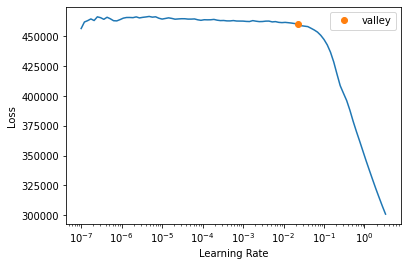

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0  750.00     689.90
1  430.00     508.19
2  725.00     710.84
3  650.00     704.92
4  750.00     671.60
XGBoost RMSE:  73.30784


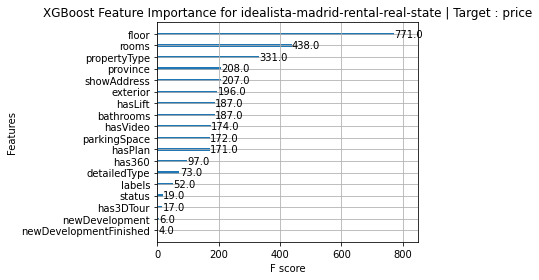

Target Variable: numPhotos
CATS=====================
['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms', 'province', 'country', 'showAddress', 'hasVideo', 'status', 'newDevelopment', 'detailedType', 'hasPlan', 'has3DTour', 'has360', 'hasStaging', 'superTopHighlight', 'topNewDevelopment', 'floor', 'hasLift', 'parkingSpace', 'labels', 'newDevelopmentFinished']
CONTS=====================
['thumbnail', 'price', 'size', 'municipality', 'distance', 'priceByArea', 'district', 'neighborhood']
31
Could not convert thumbnail to float.
Could not convert municipality to float.
Could not convert district to float.
Could not convert neighborhood to float.
Looping through continuous variables to find breakpoint
Error with  thumbnail
Error with  municipality
Error with  district
Error with  neighborhood
Continuous variables that made the cut : ['price', 'size', 'distance', 'priceByArea']
Categorical variables that made the cut : ['propertyType', 'operation', 'exterior', 'rooms', 'bathrooms

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.10629049478232266, 'Adjusted R-Squared': -0.21488635865528005, 'RMSE': 7.815873819106958, 'Time taken': 0.08313751220703125}

 19%|█▉        | 8/42 [00:00<00:00, 40.88it/s]


{'Model': 'BaggingRegressor', 'R-Squared': -0.051162961174337385, 'Adjusted R-Squared': -0.42892465034636484, 'RMSE': 8.476457244796164, 'Time taken': 0.027184247970581055}
{'Model': 'BayesianRidge', 'R-Squared': 0.29879393762368556, 'Adjusted R-Squared': 0.046798008957197545, 'RMSE': 6.923125143274876, 'Time taken': 0.009453296661376953}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.8943425518002586, 'Adjusted R-Squared': -1.5751219063534765, 'RMSE': 11.379118191146484, 'Time taken': 0.008502006530761719}
{'Model': 'DummyRegressor', 'R-Squared': -0.004632686208942971, 'Adjusted R-Squared': -0.36567255781528196, 'RMSE': 8.286726, 'Time taken': 0.007450580596923828}
{'Model': 'ElasticNet', 'R-Squared': 0.2595013756342788, 'Adjusted R-Squared': -0.006615317497152384, 'RMSE': 7.114452415648177, 'Time taken': 0.008269786834716797}
{'Model': 'ElasticNetCV', 'R-Squared': 0.2946652049404205, 'Adjusted R-Squared': 0.04118551296588413, 'RMSE': 6.943477064360085, 'Time taken': 0.0572748184

 45%|████▌     | 19/42 [00:00<00:00, 24.56it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.18858626174673632, 'Adjusted R-Squared': -0.10301555043803035, 'RMSE': 7.447328814487598, 'Time taken': 0.19210195541381836}
{'Model': 'HuberRegressor', 'R-Squared': 0.26117013945788015, 'Adjusted R-Squared': -0.004346841674444102, 'RMSE': 7.106431443863997, 'Time taken': 0.016716957092285156}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.15458474707853098, 'Adjusted R-Squared': -0.14923635944012204, 'RMSE': 7.601764, 'Time taken': 0.011487960815429688}
{'Model': 'KernelRidge', 'R-Squared': -6.640534852509864, 'Adjusted R-Squared': -9.386352065130597, 'RMSE': 22.852895382907718, 'Time taken': 0.01739215850830078}
{'Model': 'Lars', 'R-Squared': 0.28897445725235016, 'Adjusted R-Squared': 0.03344965282741352, 'RMSE': 6.971431303862536, 'Time taken': 0.017885684967041016}
{'Model': 'LarsCV', 'R-Squared': 0.284636881017549, 'Adjusted R-Squared': 0.027553260133230673, 'RMSE': 6.992663408063109, 'Time taken': 0.0348818302154541}
{'Mo

 55%|█████▍    | 23/42 [00:00<00:00, 27.03it/s]

{'Model': 'LassoLarsCV', 'R-Squared': 0.284636881017549, 'Adjusted R-Squared': 0.027553260133230673, 'RMSE': 6.992663408063109, 'Time taken': 0.02431964874267578}
{'Model': 'LassoLarsIC', 'R-Squared': 0.29774600213095714, 'Adjusted R-Squared': 0.04537347164676986, 'RMSE': 6.928296433406071, 'Time taken': 0.010926485061645508}
{'Model': 'LinearRegression', 'R-Squared': 0.28897445725235105, 'Adjusted R-Squared': 0.033449652827414744, 'RMSE': 6.9714313038625315, 'Time taken': 0.007896661758422852}
{'Model': 'LinearSVR', 'R-Squared': 0.2489540445931283, 'Adjusted R-Squared': -0.02095309563121628, 'RMSE': 7.16494080609579, 'Time taken': 0.009288311004638672}


 64%|██████▍   | 27/42 [00:01<00:00, 17.44it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.2981677203194999, 'Adjusted R-Squared': 0.04594674480932015, 'RMSE': 6.9262158276630075, 'Time taken': 0.37813258171081543}
{'Model': 'NuSVR', 'R-Squared': 0.2508085788235088, 'Adjusted R-Squared': -0.01843208816179276, 'RMSE': 7.156089256658902, 'Time taken': 0.020320653915405273}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.12624815740059359, 'Adjusted R-Squared': -0.1877564110335681, 'RMSE': 7.7281119246932555, 'Time taken': 0.010518550872802734}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.22632080859315462, 'Adjusted R-Squared': -0.05172015081868042, 'RMSE': 7.272099444458199, 'Time taken': 0.015626192092895508}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.1362493390664088, 'Adjusted R-Squared': -0.5445889452933994, 'RMSE': 8.812845830335538, 'Time taken': 0.012348413467407227}
{'Model': 'PoissonRegressor', 'R-Squared': 0.309204931420763, 'Adjusted R-Squared': 0.060950453650099656, 'RMSE': 6.871538201365033, '

 76%|███████▌  | 32/42 [00:02<00:01,  7.37it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.028581574569055412, 'Adjusted R-Squared': -0.39822807792980974, 'RMSE': 8.38491609489635, 'Time taken': 1.3496370315551758}
{'Model': 'RANSACRegressor', 'R-Squared': 0.007872118782236814, 'Adjusted R-Squared': -0.3486738385303969, 'RMSE': 8.234991935786937, 'Time taken': 0.11691617965698242}


 81%|████████  | 34/42 [00:03<00:01,  7.32it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.05769889065373435, 'Adjusted R-Squared': -0.2809405705175798, 'RMSE': 8.025538863525943, 'Time taken': 0.16264820098876953}
{'Model': 'Ridge', 'R-Squared': 0.28935802070108074, 'Adjusted R-Squared': 0.03397105939053169, 'RMSE': 6.969550677365202, 'Time taken': 0.012725114822387695}
{'Model': 'RidgeCV', 'R-Squared': 0.2922634897128099, 'Adjusted R-Squared': 0.037920681328351025, 'RMSE': 6.9552885352203155, 'Time taken': 0.009412050247192383}
{'Model': 'SGDRegressor', 'R-Squared': 0.2877484615930488, 'Adjusted R-Squared': 0.031783064978050724, 'RMSE': 6.977439008846415, 'Time taken': 0.010200977325439453}
{'Model': 'SVR', 'R-Squared': 0.2884431329807402, 'Adjusted R-Squared': 0.03272738389569374, 'RMSE': 6.974035569610636, 'Time taken': 0.016552448272705078}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.28897445725235105, 'Adjusted R-Squared': 0.033449652827414744, 'RMSE': 6.9714313038625315, 'Time taken': 0.00894474983215332}
{'

100%|██████████| 42/42 [00:03<00:00, 12.27it/s]

{'Model': 'XGBRegressor', 'R-Squared': -0.24330811307381706, 'Adjusted R-Squared': -0.69012196620972, 'RMSE': 9.21868, 'Time taken': 0.291748046875}
{'Model': 'LGBMRegressor', 'R-Squared': 0.15746669244927647, 'Adjusted R-Squared': -0.14531871495176474, 'RMSE': 7.588796207838956, 'Time taken': 0.042157649993896484}
Project: idealista-madrid-rental-real-state
idealista-madrid-rental-real-state
Target: numPhotos
numPhotos
Target Standard Deviation: 9.95376968383789
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
PoissonRegressor                             0.06       0.31  6.87        0.01
BayesianRidge                                0.05       0.30  6.92        0.01
MLPRegressor                                 0.05       0.30  6.93        0.38
LassoLarsIC                                  0.05       0.30  6.93        0.01
ElasticNetCV                                 0.04       0.

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,436.970703,470.561615,21.692432,00:00
1,344.335785,261.466278,16.169918,00:00
2,279.237122,87.981071,9.379823,00:00
3,236.872253,135.826660,11.654469,00:00


Better model found at epoch 0 with _rmse value: 21.692432403564453.
Better model found at epoch 1 with _rmse value: 16.169918060302734.
Better model found at epoch 2 with _rmse value: 9.379822731018066.
No improvement since epoch 2: early stopping


,propertyType,operation,exterior,rooms,bathrooms,province,country,showAddress,hasVideo,status,newDevelopment,detailedType,hasPlan,has3DTour,has360,hasStaging,superTopHighlight,topNewDevelopment,floor,hasLift,parkingSpace,labels,newDevelopmentFinished,numPhotos,numPhotos_pred
0,4.00,1.00,2.00,3.00,2.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,8.00,2.00,1.00,1.00,1.00,12.00,15.60
1,4.00,1.00,2.00,4.00,2.00,4.00,1.00,1.00,1.00,1.00,1.00,10.00,2.00,1.00,1.00,1.00,1.00,1.00,4.00,2.00,6.00,1.00,1.00,32.00,17.20
2,4.00,1.00,2.00,2.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,2.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,6.00,2.00,1.00,22.00,17.86
3,4.00,1.00,2.00,2.00,1.00,2.00,1.00,2.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,1.00,1.00,1.00,10.00,2.00,6.00,1.00,1.00,15.00,15.53
4,6.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,9.00,1.00,1.00,1.00,1.00,1.00,1.00,10.00,2.00,1.00,1.00,1.00,21.00,15.37
5,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,1.00,1.00,1.00,10.00,2.00,1.00,1.00,1.00,1.00,1.00,5.00,1.00,1.00,1.00,1.00,9.00,17.81
6,4.00,1.00,2.00,3.00,1.00,2.00,1.00,1.00,2.00,1.00,1.00,10.00,2.00,1.00,2.00,1.00,1.00,1.00,2.00,1.00,1.00,1.00,1.00,30.00,17.87
7,5.00,1.00,2.00,2.00,1.00,3.00,1.00,1.00,1.00,1.00,1.00,8.00,1.00,1.00,1.00,1.00,1.00,1.00,7.00,1.00,1.00,1.00,1.00,23.00,14.56
8,6.00,1.00,2.00,1.00,1.00,2.00,1.00,2.00,2.00,1.00,1.00,9.00,1.00,1.00,1.00,1.00,1.00,1.00,11.00,2.00,6.00,1.00,1.00,21.00,15.29


<Figure size 432x288 with 0 Axes>

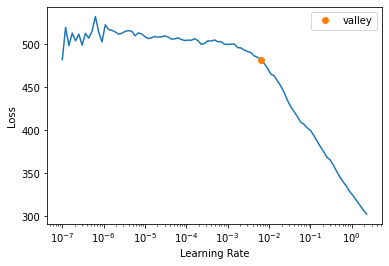

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0   22.00      17.41
1   21.00      39.80
2   22.00      11.08
3   28.00       6.43
4   13.00      24.37
XGBoost RMSE:  9.214939


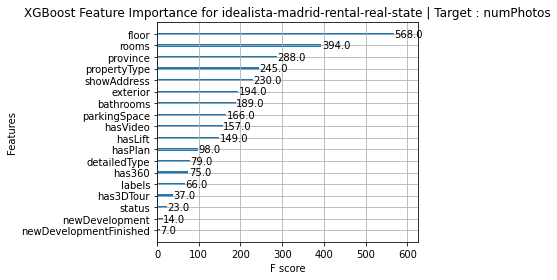

<Figure size 432x288 with 0 Axes>

In [19]:

if SEP_DOLLAR:
    #For every column in df, if the column contains a $, make a new column with the value without the $
    for col in df.columns:
        if '$' in df[col].to_string():
            df[col + '_no_dollar'] = df[col].str.replace('$', '').str.replace(',', '')


if SEP_PERCENT:
    #For every column in df, if the column contains a %, make a new column with the value without the %
    for col in df.columns:
        if '%' in df[col].to_string():
            df[col + '_no_percent'] = df[col].str.replace('%', '').str.replace(',', '')

target = ''
target_str = ''
#The column closest to the end isPARAM_DIR the target variable that can be represented as a float is the target variable
targets = []
#Loop through every possible target column (Continuous)
for i in range(len(df.columns)-1, 0, -1):
    try:
        df[df.columns[i]] = df[df.columns[i]].astype(float)
        target = df.columns[i]
        target_str = target.replace('/', '-')
    except:
        continue
    print(f'Target Variable: {target}')
    #Will be determined by the file name


    #===================================================================================================

    #Create project config files if they don't exist.
    if not os.path.exists(param_dir):
        #create param_dir
        os.makedirs(PARAM_DIR)
    if not os.path.exists(f'{PARAM_DIR}/cats.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/cats.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/conts.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/conts.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/cols_to_delete.txt'):
        with open(f'{PARAM_DIR}/cols_to_delete.txt', 'w') as f:
            f.write('')

    df = df.drop_duplicates()
    if SHUFFLE_DATA:
        df = df.sample(frac=1).reset_index(drop=True)

    # workaround for fastai/pytorch bug where bool is treated as object and thus erroring out.
    for n in df:
        if pd.api.types.is_bool_dtype(df[n]):
            df[n] = df[n].astype('uint8')

    with open(f'{PARAM_DIR}/cols_to_delete.txt', 'r') as f:
        cols_to_delete = f.read().splitlines()
    for col in cols_to_delete:
        try:
            del(df[col])
        except:
            pass
    #try to fill in missing values now, otherwise FastAI will do it for us later
    try:
        df = df.fillna(0)
    except:
        pass
    #print missing values
    #print(df.isna().sum().sort_values(ascending=False))
    #shrink df as much as possible
    df = df_shrink(df)


    #print types inside of df
    #print(df.dtypes)


    #Auto detect categorical and continuous variables
    #==============================================================================
    likely_cat = {}
    for var in df.columns:
        likely_cat[var] = 1.*df[var].nunique()/df[var].count() < 0.05 #or some other threshold

    cats = [var for var in df.columns if likely_cat[var]]
    conts = [var for var in df.columns if not likely_cat[var]]

    #remove target from lists
    try:
        conts.remove(target)
        cats.remove(target)
    except:
        pass
    #Convert target to float
    df[target] = df[target].astype(float)

    print('CATS=====================')
    print(cats)
    print('CONTS=====================')
    print(conts)

    #Populate categorical and continuous lists
    #==============================================================================

    if VARIABLE_FILES == True:
        with open(f'{PARAM_DIR}/cats.txt', 'r') as f:
            cats = f.read().splitlines()

        with open(f'{PARAM_DIR}/conts.txt', 'r') as f:
            conts = f.read().splitlines()

    #==============================================================================

    #==============================================================================
    procs = [Categorify, FillMissing, Normalize]
    #print(df.describe().T)
    df = df[0:SAMPLE_COUNT]
    splits = RandomSplitter()(range_of(df))

    print((len(cats)) + len(conts))
    #conts = []

    #Convert cont variables to floats
    #==============================================================================

    #Convert cont variables to floats
    #==============================================================================

    for var in conts:
        try:
            df[var] = df[var].astype(float)
        except:
            print(f'Could not convert {var} to float.')
            pass

    #==============================================================================

    #Experimental logic to add columns one-by-one to find a breakpoint
    #==============================================================================
    if ENABLE_BREAKPOINT == True:
        temp_procs = [Categorify, FillMissing]
        print('Looping through continuous variables to find breakpoint')
        cont_list = []
        for cont in conts:
            focus_cont = cont
            cont_list.append(cont)
            #print(focus_cont)
            try:
                to = TabularPandas(df, procs=procs, cat_names=cats, cont_names=cont_list, 
                    y_names=target, y_block=RegressionBlock(), splits=splits)
                del(to)
            except:
                print('Error with ', focus_cont)
                #remove focus_cont from list
                cont_list.remove(focus_cont)
                #traceback.print_exc()
                continue
        #convert all continuous variables to floats
        for var in cont_list:
            try:
                df[var] = df[var].astype(float)
            except:
                print(f'Could not convert {var} to float.')
                cont_list.remove(var)
                if CONVERT_TO_CAT == True:
                    cats.append(var)
                pass
        print(f'Continuous variables that made the cut : {cont_list}')
        print(f'Categorical variables that made the cut : {cats}')
        #shrink df as much as possible
        df = df_shrink(df)
        #print(df.dtypes)

    #==============================================================================

    #Creating tabular object + quick preprocessing
    #==============================================================================
    to = None
    if REGRESSOR == True:
        try:
            to = TabularPandas(df, procs, cats, conts, target, 
            y_block=RegressionBlock(), splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, 
            y_block=RegressionBlock(), splits=splits)
    else:
        try:
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)

    #print(dir(to))
    #print(to.xs)
    dls = to.dataloaders()
    print(f'Tabular Object size: {len(to)}')
    try:
        dls.one_batch()
    except:
        print(f'problem with getting one batch of {PROJECT_NAME}')
    #==============================================================================

    #Extracting train and test sets from tabular object
    #==============================================================================

    X_train, y_train = to.train.xs, to.train.ys.values.ravel()
    X_test, y_test = to.valid.xs, to.valid.ys.values.ravel()

    #Make sure target isn't in independent columns
    if target in X_train and target in X_test:
        del(X_train[target])
        del(X_test[target])
    #create dataframe from X_train and y_train
    #export tabular object to csv
    pd.DataFrame(X_train).to_csv(f'{PARAM_DIR}/X_train_{target_str}.csv', index=False)
    pd.DataFrame(X_test).to_csv(f'{PARAM_DIR}/X_test_{target_str}.csv', index=False)
    pd.DataFrame(y_train).to_csv(f'{PARAM_DIR}/y_train_{target_str}.csv', index=False)
    pd.DataFrame(y_test).to_csv(f'{PARAM_DIR}/y_test_{target_str}.csv', index=False)

    #==============================================================================

    #==============================================================================

    #Ready for model selection!

    if REGRESSOR == True:
        try:
            reg = LazyRegressor(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = reg.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            target_std = y_train.std()
            print(f'Target Standard Deviation: {target_std}')
            print(models)
            models['project'] = PROJECT_NAME
            models['target'] = target
            models['target_std'] = target_std
            #rename index of 
            models.to_csv(f'{PARAM_DIR}/regression_results_{target_str}.csv', mode='a', header=True, index=True)
        except:
            print('Issue during lazypredict analysis')
    else:
        #TODO: remove this
        try:
            clf = LazyClassifier(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = clf.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            print(f'Target Standard Deviation: {y_train.std()}')
            print(models)
            models.to_csv(f'{PARAM_DIR}/classification_results.csv', mode='a', header=False)
        except:
            print('Issue during lazypredict analysis')

    model_name = 'tabnet'

    # FastAI + pre-trained TabNet
    #==============================================================================
    learn = None
    i = 0
    while True:
        try:
            del learn
        except:
            pass
        try:
            learn = 0
            model = TabNetModel(get_emb_sz(to), len(to.cont_names), dls.c, n_d=64, n_a=64, n_steps=5, virtual_batch_size=256)
            # save the best model so far, determined by early stopping
            cbs = [SaveModelCallback(monitor='_rmse', comp=np.less, fname=f'{model_name}_{PROJECT_NAME}_{target_str}_best'), EarlyStoppingCallback()]
            learn = Learner(dls, model, loss_func=MSELossFlat(), metrics=rmse, cbs=cbs)
            #learn = get_learner(to)
            if(learn != 0):
                break
            if i > 50:
                break
        except:
            i += 1
            print('Error in FastAI TabNet')
            traceback.print_exc()
            continue
    try:
        #display learning rate finder results
        x = learn.lr_find()
    except:
        pass
    if AUTO_ADJUST_LEARNING_RATE == True:
        FASTAI_LEARNING_RATE = x.valley
    print(f'LEARNING RATE: {FASTAI_LEARNING_RATE}')
    try:
        if i < 50:
            learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
            plt.figure(figsize=(10, 10))
            try:
                ax = learn.show_results()
                plt.show(block=True)
            except:
                print('Could not show results')
                pass
    except:
        print('Could not fit model')
        traceback.print_exc()
        pass

    #==============================================================================

    #fit an xgboost model
    #==============================================================================
    if REGRESSOR == True:
        xgb = XGBRegressor()
    else:
        xgb = XGBClassifier()
    try:
        xgb = XGBRegressor()
        xgb.fit(X_train, y_train)
        y_pred = xgb.predict(X_test)
        print('XGBoost Predictions vs Actual==========')
        print(pd.DataFrame({'actual': y_test, 'predicted': y_pred}).head())
        print('XGBoost RMSE: ', np.sqrt(mean_squared_error(y_test, y_pred)))
        #save feature importance plot to file
        plot_importance(xgb)
        plt.title(f'XGBoost Feature Importance for {PROJECT_NAME} | Target : {target}', wrap=True)
        plt.tight_layout()
        plt.show()
        plt.savefig(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.png')
        fi_df = pd.DataFrame([xgb.get_booster().get_score()]).T
        fi_df.columns = ['importance']
        #create a column based off the index called feature
        fi_df['feature'] = fi_df.index
        #create a dataframe of feature importance
        fi_df = fi_df[['feature', 'importance']]
        fi_df.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv', index=False)
        #xgb_fi = pd.DataFrame(xgb.feature_importances_, index=X_train.columns, columns=['importance'])
        #xgb_fi.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv')
        #print('XGBoost AUC: ', roc_auc_score(y_test, y_pred))
    except:
        traceback.print_exc()
        print('XGBoost failed')

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Overall Feature Importance**</div>

        feature  importance
0  propertyType      275.00
1      exterior      181.00
2         rooms      366.00
3     bathrooms      142.00
4      province      153.00


<AxesSubplot:title={'center':'XGBoost Overall Feature Importance'}, xlabel='feature'>

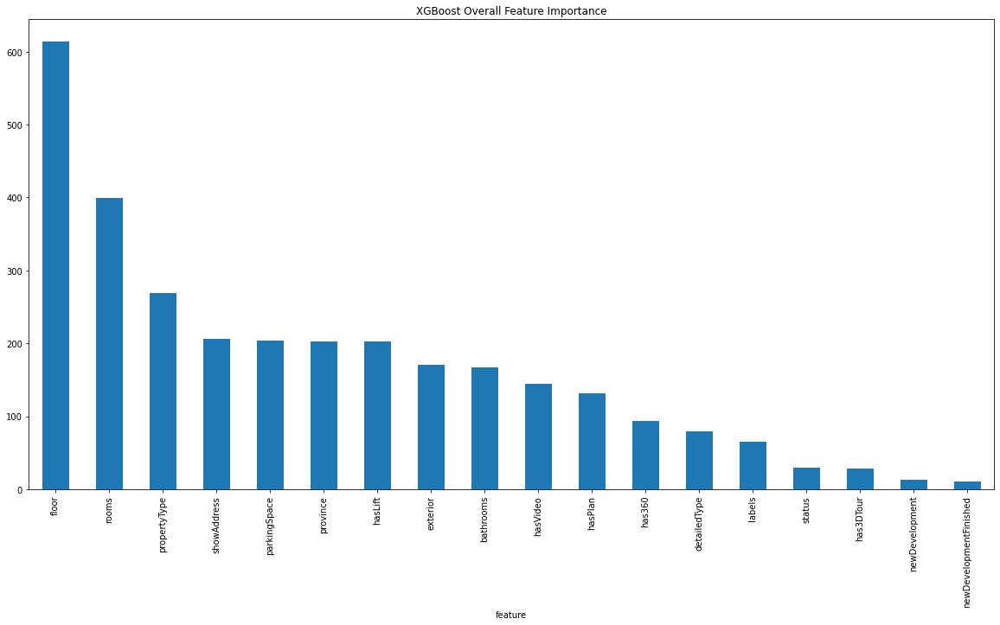

In [20]:
out_dir = f'./{PROJECT_NAME}'
xgb_feature_importance_csvs = []

for file in os.listdir(out_dir):
    if 'xgb_feature_importance' in file and '.csv' in file:
        xgb_feature_importance_csvs.append(pd.read_csv(os.path.join(out_dir, file)))

xgb_feature_importance = pd.concat(xgb_feature_importance_csvs,axis=0)
xgb_feature_importance.rename(columns={'Unnamed: 0': 'feature'}, inplace=True)
print(xgb_feature_importance.head())
xgb_feature_importance.groupby('feature')['importance'].mean().sort_values(ascending=False).plot(kind='bar', title='XGBoost Overall Feature Importance', figsize=(20, 10))

In [21]:
df.isna().sum()

thumbnail                 0
numPhotos                 0
price                     0
propertyType              0
operation                 0
size                      0
exterior                  0
rooms                     0
bathrooms                 0
province                  0
municipality              0
country                   0
showAddress               0
distance                  0
hasVideo                  0
status                    0
newDevelopment            0
priceByArea               0
detailedType              0
hasPlan                   0
has3DTour                 0
has360                    0
hasStaging                0
superTopHighlight         0
topNewDevelopment         0
floor                     0
district                  0
neighborhood              0
hasLift                   0
parkingSpace              0
labels                    0
newDevelopmentFinished    0
dtype: int64

# **To Be Continued...**